**Summary:** remove a narrow frequency band from a Parasite call (Section 2), and then implant removed band/signal to a Single Host signal (Section 3).

**NOTE:** The 'implantation' step can happen either in the time or the frequency domain. So far results indicate that there is no clear difference between the two, based on the resulting signal. This still needs to be addressed more carefully

**Author:** E.R.

**Last updated:** Monday 10/24/2022, 16:30

**Version** 4


# 1 Preliminaries

## 1.1 Get data

### download localy some 15s files

**this is a Parasite 1 call**

In [1]:
!gdown 159nFA9ivEE5dQkRDB7hOop90_unzlEve

Downloading...
From: https://drive.google.com/uc?id=159nFA9ivEE5dQkRDB7hOop90_unzlEve
To: /content/LT075_161IM_15s.wav
100% 1.44M/1.44M [00:00<00:00, 34.2MB/s]


**This is a Single Host 1 call**

In [2]:
!gdown 1RC9zzB8dbWwWw8FN1qdlr8LlpQZllJs2

Downloading...
From: https://drive.google.com/uc?id=1RC9zzB8dbWwWw8FN1qdlr8LlpQZllJs2
To: /content/LT117_161LT.wav
100% 1.44M/1.44M [00:00<00:00, 42.1MB/s]


## 1.2 Set up environment and functions

module for Amplitude Modulation Analysis

In [ ]:
!git clone https://github.com/MuSAELab/amplitude-modulation-analysis-module.git

In [ ]:
!pip install /content/amplitude-modulation-analysis-module

### 1.2.1 import useful stuff

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy.signal import hilbert, butter, lfilter, freqz
from scipy import signal as sig
import pandas as pd
from IPython.display import Audio
import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf

import os

from am_analysis import am_analysis as ama

### 1.2.2 Build some filters 

#### 1.2.2.1 bandpass (Butterworth) filter

In [12]:

def butter_bandpass(lowcut, highcut, fs, order=2):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='bandpass')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=6):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    #y = lfilter(b, a, data)
    y = sig.filtfilt(b, a, data, method='gust')

    return y



#### 1.2.2.2 another bandpass filter using *FIR*

In [31]:

def bandpass(input, fs, fpl, fph, bandwidth, ripple_db=65.0):
        """
        Designs a FIR filter that is a bandpass filter.
        fs : sampling frequency (Hz)
        fpl : low pass frequency (Hz)
        fph : high pass frequency (Hz)
        bandwidth : transition bandwidth (Hz)s
        """
        # Compute the order and Kaiser parameter for the FIR filter.
        N, beta = sig.kaiserord(ripple_db, bandwidth / (fs * 0.5) )

        # Use firwin with a Kaiser window to create a lowpass FIR filter.
        taps = sig.firwin(N, [fpl / (fs * 0.5), fph / (fs * 0.5)], window=('kaiser', beta),pass_zero='bandpass')

        # the filter must be symmetric, in order to be zero-phase
        assert np.all(np.abs(taps - taps[::-1]) < 1e-15)

        input_filt = sig.filtfilt(taps, 1, input, method = 'pad', padtype = 'constant')

        return input_filt

#### 1.2.2.3 lowpass filter

In [32]:
def lowpass(input, fs, fc, bandwidth, ripple_db=65.0):
        """
        Designs a FIR filter that is a low-pass filter.
        fs : sampling frequency (Hz)
        fc : cut-off frequency (Hz)
        bandwidth : transition bandwidth (Hz)s
        """
        # Compute the order and Kaiser parameter for the FIR filter.
        N, beta = sig.kaiserord(ripple_db, bandwidth / (fs * 0.5) )

        # Use firwin with a Kaiser window to create a lowpass FIR filter.
        taps = sig.firwin(N, fc / (fs * 0.5), window=('kaiser', beta))

        # the filter must be symmetric, in order to be zero-phase
        assert np.all(np.abs(taps - taps[::-1]) < 1e-15)

        input_filt = sig.filtfilt(taps, 1, input, method = 'pad', padtype = 'constant')

        return input_filt

#### 1.2.2.4 bandstop (notch) filter

In [33]:
def bandstop(input,fs, fstop, quality_factor=1.2):
    """
    Designs a IIR bandstop filter.
    fs : sampling frequency (Hz)
    fstop : frequency to remove (Hz)
    quality_factor : dimensionless parameter that characterises quality
    """
    b_notch, a_notch = sig.iirnotch(fstop, quality_factor, fs)
    input_notched = sig.filtfilt(b_notch, a_notch, input)
    w,h = sig.freqz(b_notch, a_notch, worN=16384)
    return input_notched, w, h


#### 1.2.2.5 bandstop (Butterworth) filter


In [34]:


#def butter_bandstop(lowcut, highcut, fs, order=3):
#    nyq = 0.5 * fs
#    low = lowcut / nyq
#    high = highcut / nyq
#    b, a = butter(order, [low, high], btype='bandstop')
#    return b, a


def butter_bandstop_filter(data, lowcut, highcut, fs, order=3):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='bandstop')
    #b, a = butter_bandstop(lowcut, highcut, fs, order=order)

    z, p, k = sig.tf2zpk(b, a)
    eps = 1e-9
    r = np.max(np.abs(p))
    approx_impulse_len = int(np.ceil(np.log(eps) / np.log(r)))


    y = sig.filtfilt(b, a, data, method='gust',irlen=approx_impulse_len)

    w,h = sig.freqz(b, a, worN=16384)
    f=(fs/2)*w/(np.pi)  
    return y, f , h

## 1.3 choose a signal to work on

In [ ]:
!ls /content

amplitude-modulation-analysis-module  LT100_174LT_15s.wav  LT133_161LT.wav
LT075_161IM_15s.wav		      LT117_161LT.wav	   sample_data


**choose a file for parasite 1 (audiofile_P1)**

In [17]:
audiofile_P1 = '/content/LT075_161IM_15s.wav'

**choose a file for brood host 1 (audiofile_BH1)**

In [18]:
audiofile_SH1 = 'LT117_161LT.wav'

**Plot the full audiowaves (named `signal_full_P1` and `signal_full_SH1`)**

total audio duration of file /content/LT075_161IM_15s.wav is : 15.02s


[]

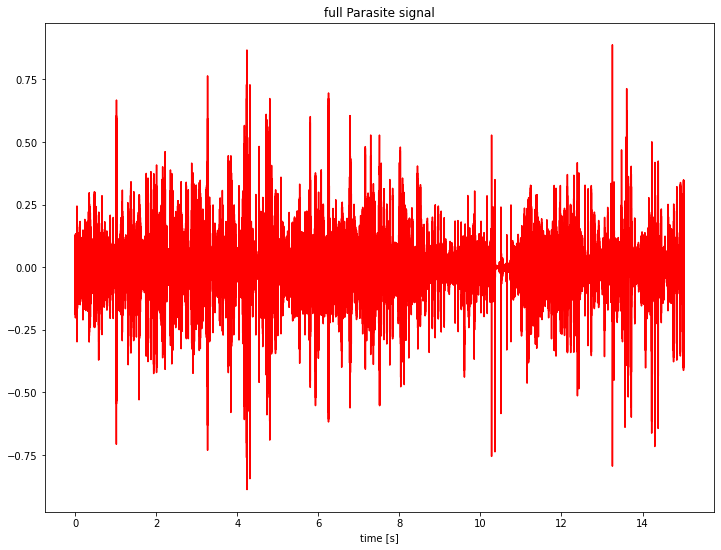

In [19]:
signal_full_P1, sr = librosa.load(audiofile_P1)
print(f'total audio duration of file {audiofile_P1} is : {len(signal_full_P1)/sr:.2f}s')

t = np.linspace(0,len(signal_full_P1)/sr, len(signal_full_P1))
plt.figure(figsize=(12,9))
plt.plot(t, signal_full_P1,c='r')
plt.xlabel('time [s]')
plt.title('full Parasite signal')
plt.plot()

total audio duration of file LT117_161LT.wav is : 15.03s


[]

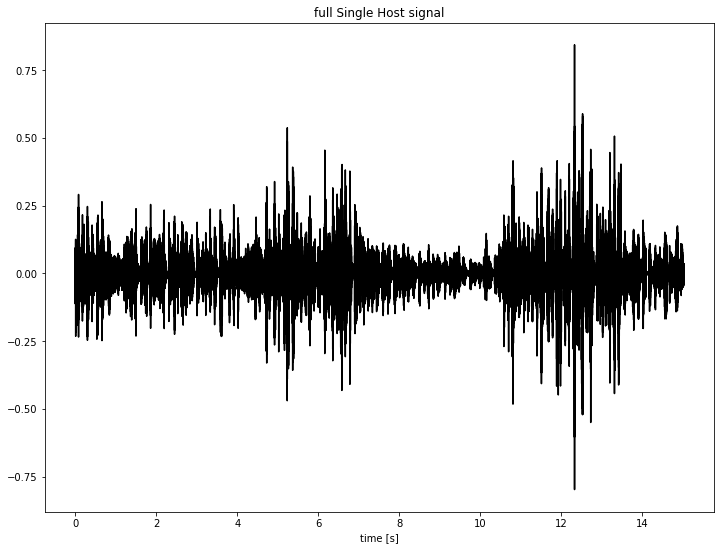

In [20]:
signal_full_SH1, sr = librosa.load(audiofile_SH1)
print(f'total audio duration of file {audiofile_SH1} is : {len(signal_full_SH1)/sr:.2f}s')

t = np.linspace(0,len(signal_full_SH1)/sr, len(signal_full_SH1))
plt.figure(figsize=(12,9))
plt.plot(t, signal_full_SH1,c='k')
plt.xlabel('time [s]')
plt.title('full Single Host signal')
plt.plot()

**Listen to the audio files**

In [21]:
print('PARASITE FULL DURATION AUDIO')

Audio(data=signal_full_P1,rate=sr)

PARASITE FULL DURATION AUDIO


In [22]:
print('SINGLE HOST FULL DURATION AUDIO')

Audio(data=signal_full_SH1,rate=sr)

SINGLE HOST FULL DURATION AUDIO


**Choose only a small clip (named `signalP1` and `signalSH1`) to work on**

[]

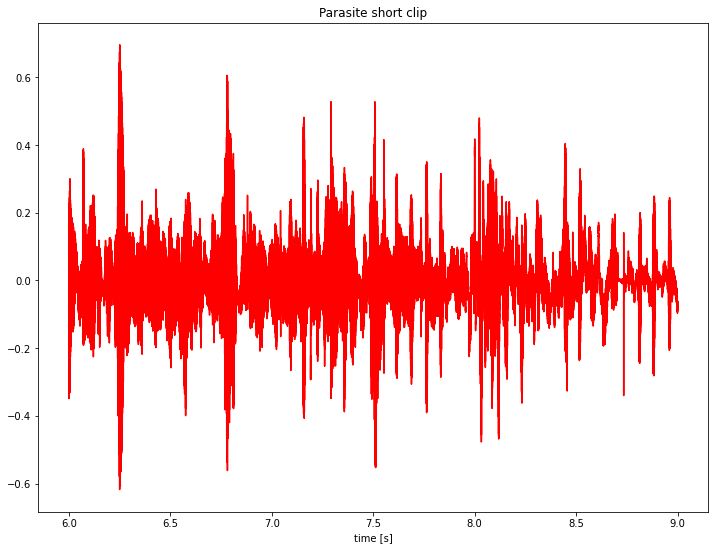

In [23]:
# choose a clip of the full audio file.
# start at 'signal_start' seconds
# and get a clip of duration 'signal_duration' seconds
signal_start_P1 = 6
signal_duration_P1 = 3

signalP1 = signal_full_P1[signal_start_P1*sr:(signal_start_P1 + signal_duration_P1)*sr]

t = np.linspace(signal_start_P1,signal_start_P1+signal_duration_P1, len(signalP1))
plt.figure(figsize=(12,9))
plt.plot(t, signalP1,c='r')
plt.xlabel('time [s]')
plt.title('Parasite short clip')
plt.plot()

[]

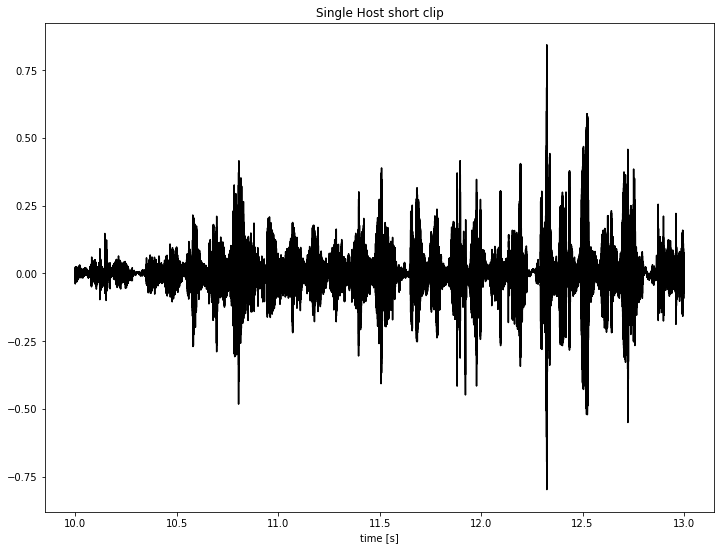

In [24]:
# choose a clip of the full audio file.
# start at 'signal_start' seconds
# and get a clip of duration 'signal_duration' seconds
signal_start_SH1 = 10
signal_duration_SH1 = 3

signalSH1 = signal_full_SH1[signal_start_SH1*sr:(signal_start_SH1 + signal_duration_SH1)*sr]

t = np.linspace(signal_start_SH1,signal_start_SH1+signal_duration_SH1, len(signalSH1))
plt.figure(figsize=(12,9))
plt.plot(t, signalSH1,c='k')
plt.xlabel('time [s]')
plt.title('Single Host short clip')
plt.plot()

**Listen to the audio clips**

In [25]:
print('SELECTED PART OF PASARISE AUDIO CLIP')

Audio(data=signalP1,rate=sr)

SELECTED PART OF PASARISE AUDIO CLIP


In [26]:
print('SELECTED PART OF SINGLE HOST AUDIO CLIP')

Audio(data=signalSH1,rate=sr)

SELECTED PART OF SINGLE HOST AUDIO CLIP


## 1.4 Modulation Spectrogram of original signals

**Plot the modulation spectrograms of the full or clipped audio files**

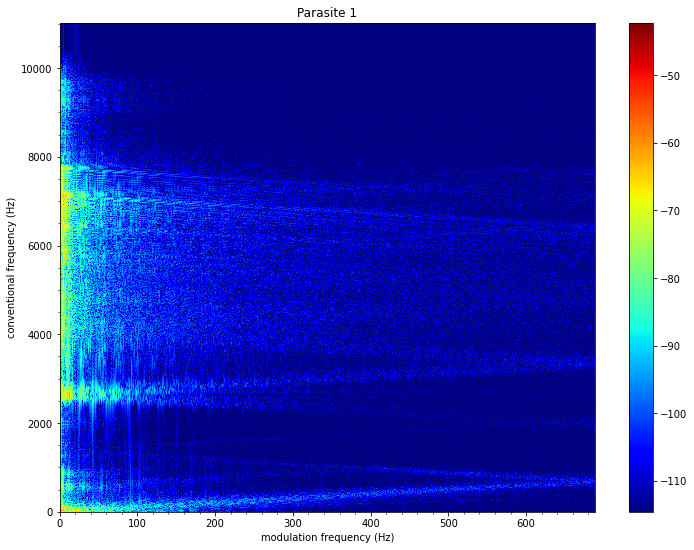

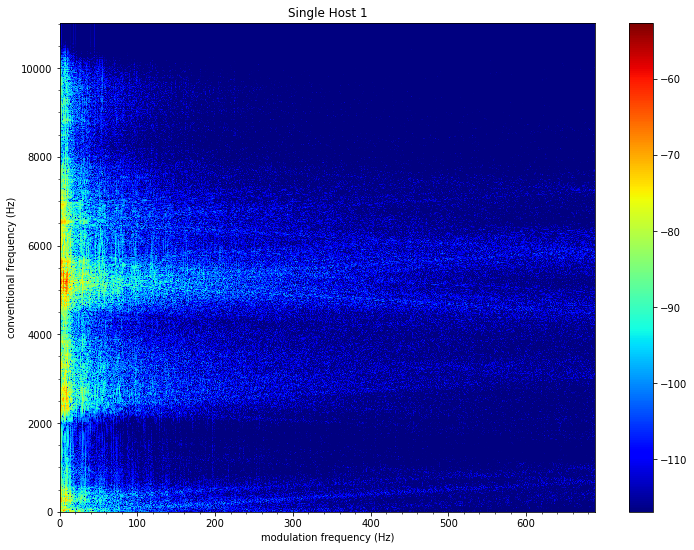

In [27]:

window_size = 1024
window_shift = 16

#choose signal_full or signal as input
ama_input = signalP1

rfft_mod = ama.strfft_modulation_spectrogram(ama_input,
                                             sr,
                                             window_size,
                                             window_shift,
                                             channel_names=' ',
                                             win_function_y='boxcar',
                                             win_function_x='boxcar')


plt.figure(figsize=(12,9))
ama.plot_modulation_spectrogram_data(rfft_mod, c_map='jet')#,modf_range=[1,40])
#plt.xlim([0,100])
plt.title('Parasite 1')
plt.show()




window_size = 1024
window_shift = 16

#choose signal_full or signal as input
ama_input = signalSH1

rfft_mod = ama.strfft_modulation_spectrogram(ama_input,
                                             sr,
                                             window_size,
                                             window_shift,
                                             channel_names=' ',
                                             win_function_y='boxcar',
                                             win_function_x='boxcar')


plt.figure(figsize=(12,9))
ama.plot_modulation_spectrogram_data(rfft_mod, c_map='jet')#,modf_range=[1,40])
#plt.xlim([0,100])
plt.title('Single Host 1')
plt.show()

# 2 **Modulation filtering** *(remove AE frequencies from Parasite 1)*




---


Here is the modulation filtering part.

The process followed in the following sections is the following:

1) The original signal is split in frequency bands

2) For each of the frequency bands, calculate the amplitude envelope (AE)

3) Each AE is passed through a bandstop filter to remove a given range of frequencies

4) Half-wave rectify each AE after the bandstop filtering (that is: if negative amplitudes were introduce during the filtering, set those to zero).

5) The bandstop-filtered AE of each frequency band signal is divided by the AE of the original frequency band signal. Then, the above ratio for each frequency band is multiplied with the original signal of that band

6) **CURRENTLY NOT USING THIS STEP** A bandstop filter is again applied on all of the band signals resulted from step 5), in order to remove any frequencies outside the range of each bank-filter which might have been introduced during the earlier modulation filtering in step 3).

7) Add all bands together to get the modulation filter (or modified) signal.

---

8) Some modulation spectrograms and audios are created at the end to compare original and final product.

## 2.1 Filter bank original signal

We will 'split' the original signal to 'sub-signals' containing only frequencies of each of the above frequency bands. To do that, we apply bandpass filters to the original signal.

First, create frequency bands for the filter bank

**Choose option 1 or 2 below**

*For now, I think option 2 works best*

-- **Option 1** Create bands with octave length each (important is that the final frequency will not be above sampling_rate/2)

In [ ]:
# start with frequency of 10Hz and creating intervals of an octave each. Remember: upper frequency is half the sampling rate (in this case 11025Hz).

freqs = [5]

for i in range(1,12):
  freqs.append(freqs[i-1]*2)

print('the frequency intervals are:',freqs)

the frequency intervals are: [5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240]


-- **Option 2** Create frequency bands in a linear fashion by setting upper frequency, lower frequency, and number of intervals

In [35]:
freqs = np.linspace(2,11000,17)

print('the frequency intervals are:',freqs)

the frequency intervals are: [2.0000000e+00 6.8937500e+02 1.3767500e+03 2.0641250e+03 2.7515000e+03
 3.4388750e+03 4.1262500e+03 4.8136250e+03 5.5010000e+03 6.1883750e+03
 6.8757500e+03 7.5631250e+03 8.2505000e+03 8.9378750e+03 9.6252500e+03
 1.0312625e+04 1.1000000e+04]


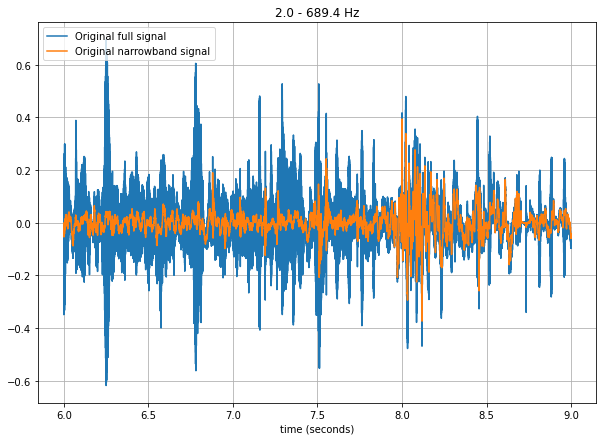

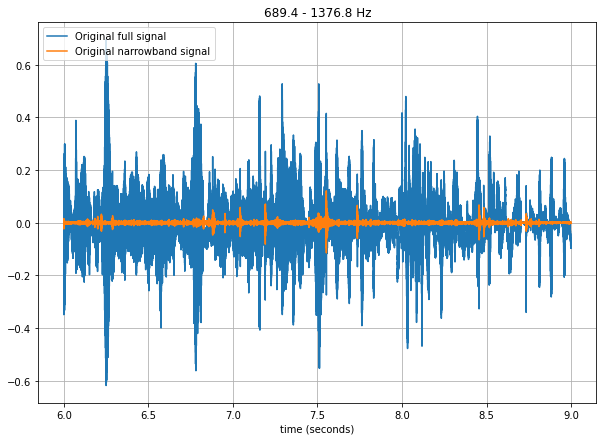

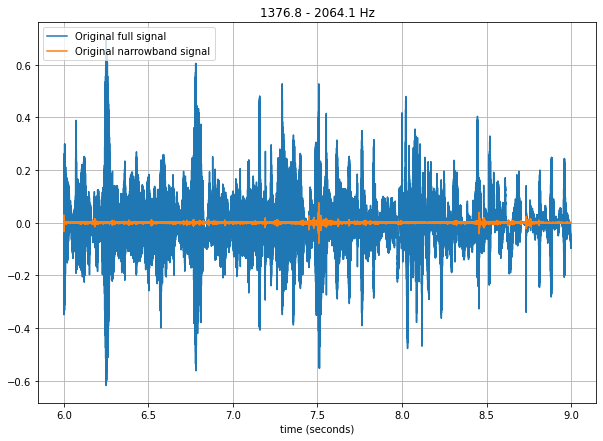

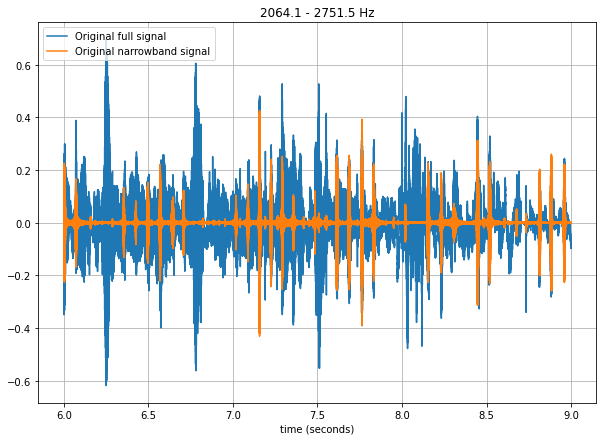

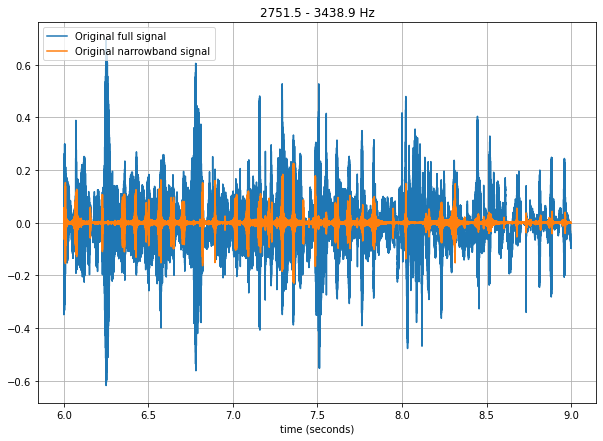

...

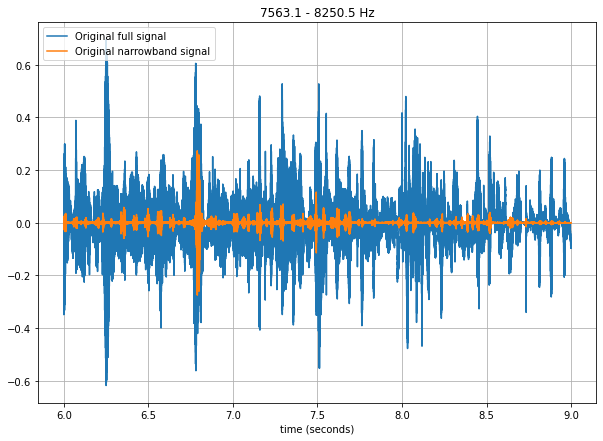

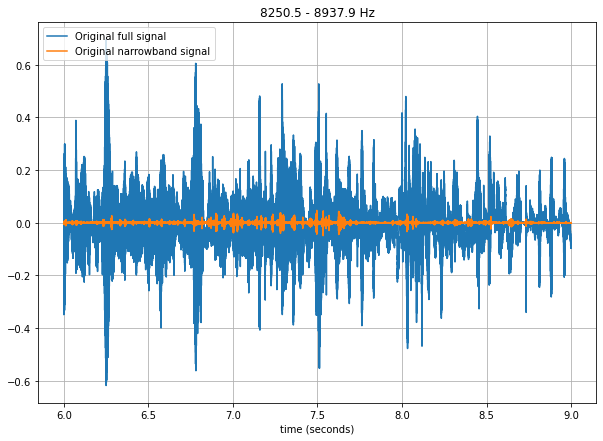

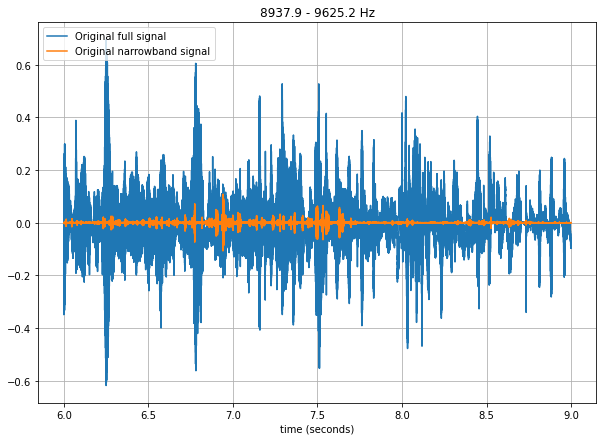

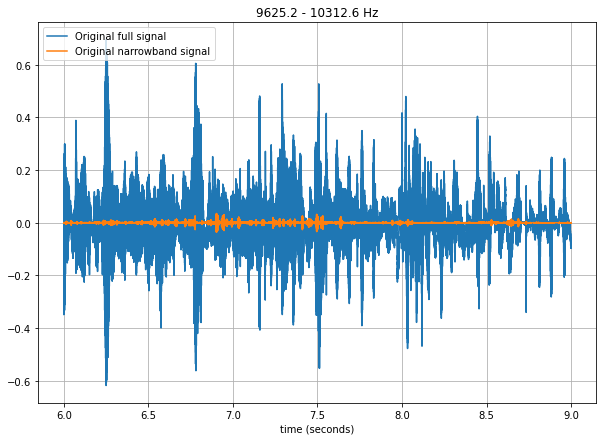

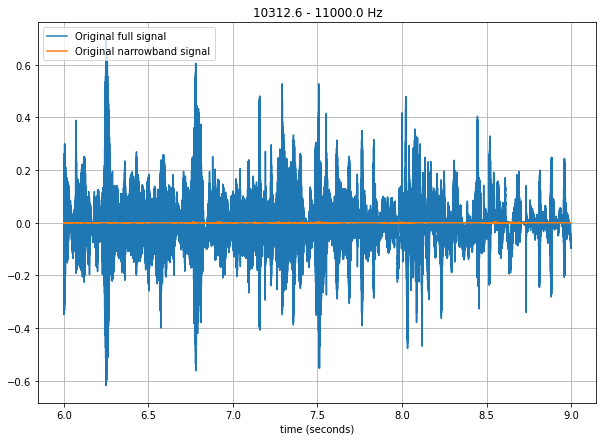

In [36]:
# apply bank-filters to the original signal to create narrowband signals. These will be our 'original narrowband signals' of the Parasite signal from now on.

# timepoints for the plots
t = np.linspace(signal_start_P1, signal_start_P1 + signal_duration_P1, len(signalP1), endpoint=False)

# do the bank-filtering
bp_signalP1 = []
for i in range(len(freqs)-1):
  lowcut = freqs[i]
  highcut = freqs[i+1]

  bp_signalP1.append(bandpass(signalP1, sr, lowcut, highcut, bandwidth=10,ripple_db=50))
  plt.figure(figsize=(10,7))
  plt.clf()
  plt.plot(t, signalP1, label='Original full signal')
  plt.plot(t, bp_signalP1[i], label='Original narrowband signal' )
  plt.xlabel('time (seconds)')
  plt.grid(True)
  plt.axis('tight')
  #plt.ylim([-1,1])
  plt.legend(loc='upper left')
  plt.title(str(round(lowcut,1))+' - '+str(round(highcut,1))+' Hz')
  plt.show()


## 2.2 Get Amplitude Envelopes (AE)

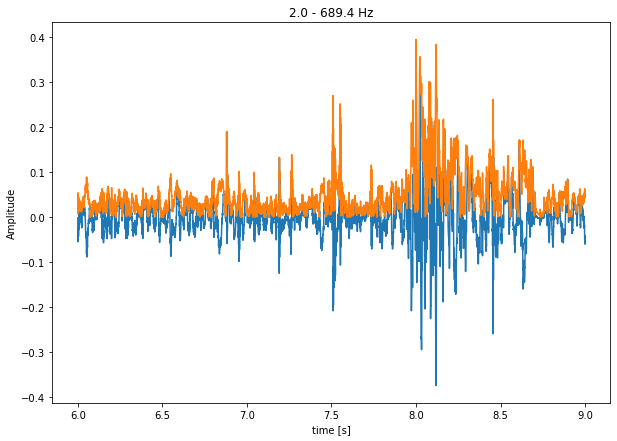

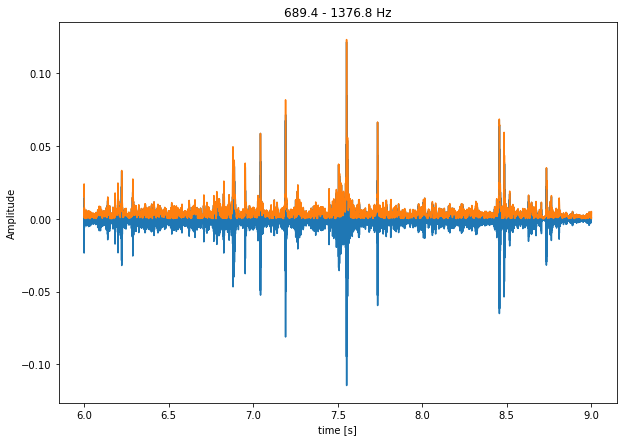

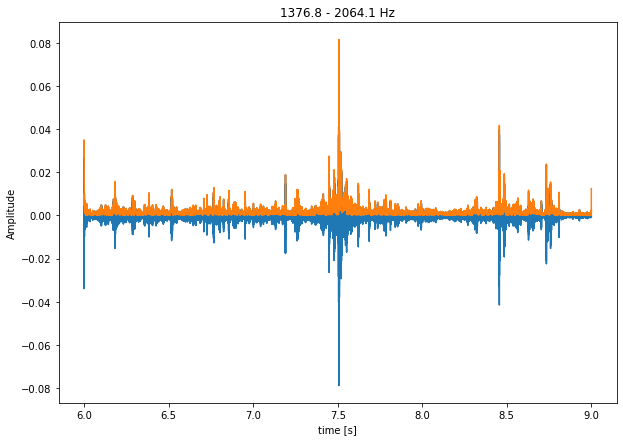

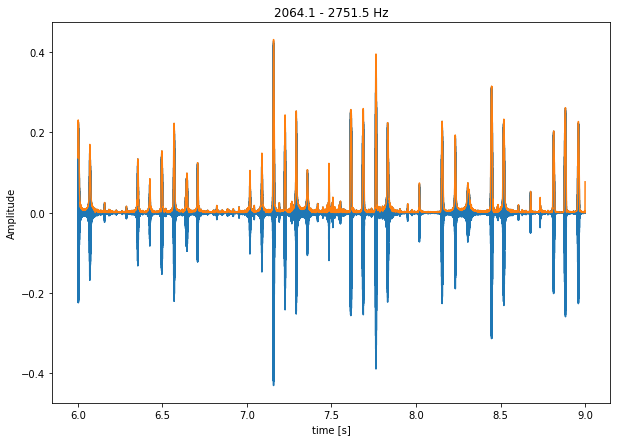

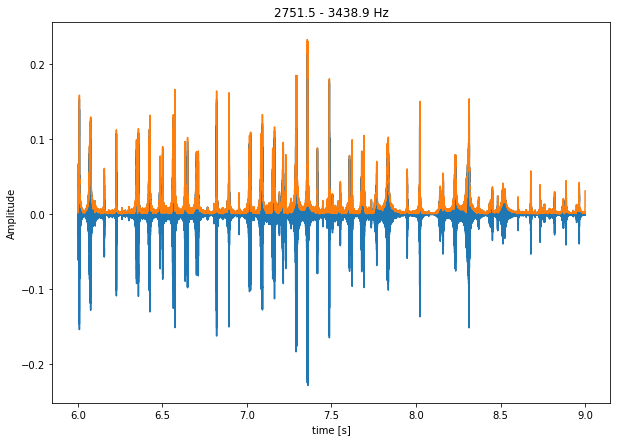

...

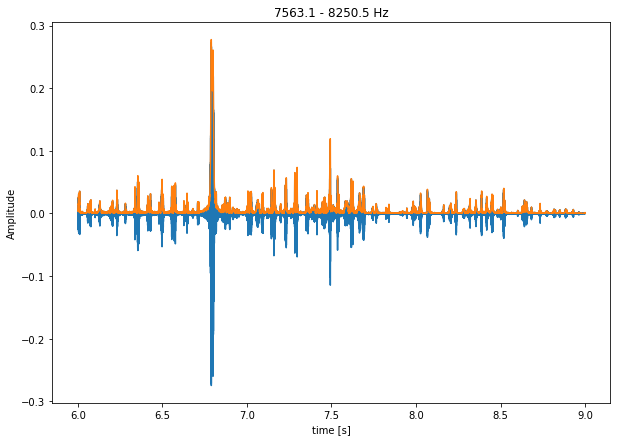

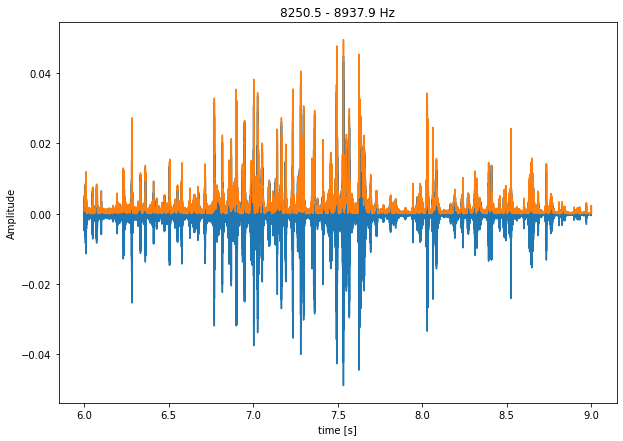

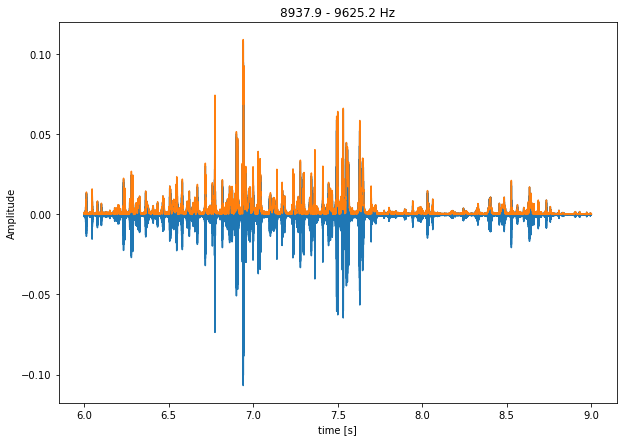

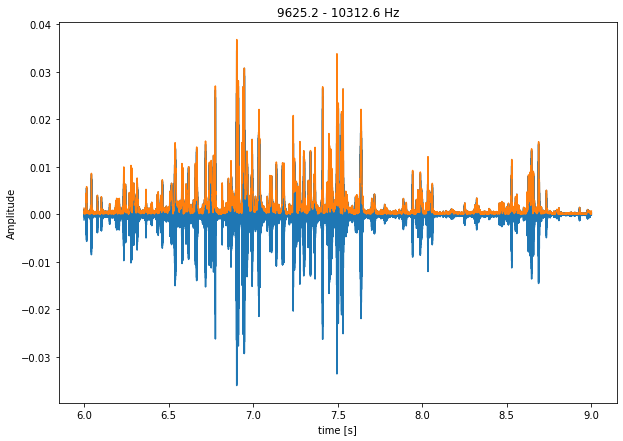

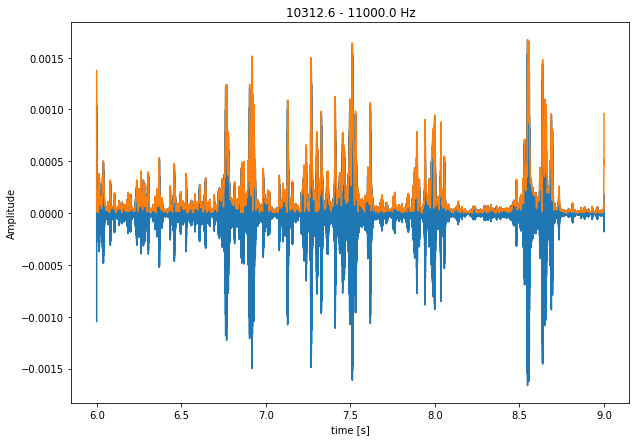

In [37]:
# For each of the original narrowband signals get the A.E. using Hilbert transform

amp_env_P1 = []
inst_phase_o_P1 = []
f_i=0
for s in bp_signalP1:
  lowcut = freqs[f_i]
  highcut = freqs[f_i+1]
  z = (hilbert(s)) #form the analytical signal
  amp_env_P1.append(np.abs(z)) #envelope extraction
  inst_phase_o_P1.append(np.unwrap(np.angle(z)))#inst phase
  inst_freq = np.diff(inst_phase_o_P1)/(2*np.pi)*sr #inst frequency

  plt.figure(figsize=(10,7))
  plt.plot(t,s)
  plt.plot(t,amp_env_P1[-1])
  #plt.ylim([-0.5,0.5])
  plt.xlabel('time [s]')
  plt.ylabel('Amplitude')
  plt.title(str(round(lowcut,1))+' - '+str(round(highcut,1))+' Hz')
  plt.show()
  f_i+=1

### 2.2.1 Power Spectral Density of AE

For full wideband signal AE

☣ Improve PSD plots: make cleaner, use log binning etc

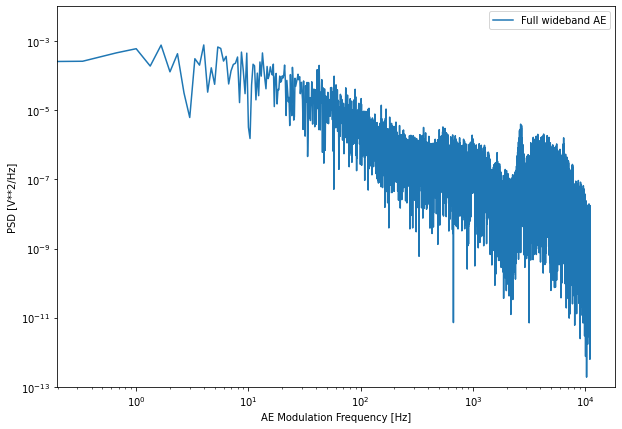

In [38]:
full_amp_env_P1 = hilbert(signalP1)

f_psd,psd = sig.periodogram(np.abs(full_amp_env_P1),sr)

plt.figure(figsize=(10,7))
plt.plot(f_psd,psd,label='Full wideband AE')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('AE Modulation Frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
#plt.xlim([1,500])
plt.ylim([1e-13,1e-2])
plt.legend()
plt.show()

For narrowband signals AE

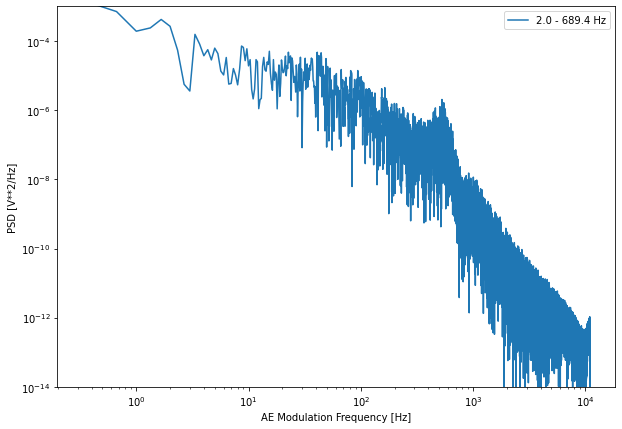

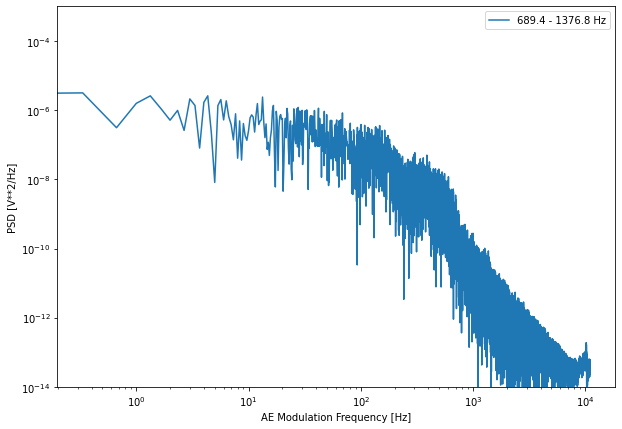

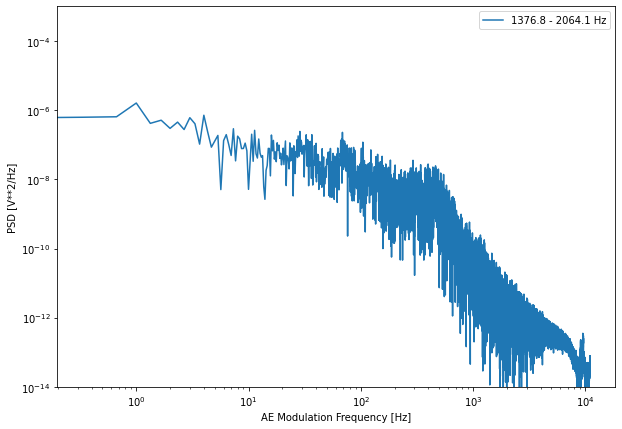

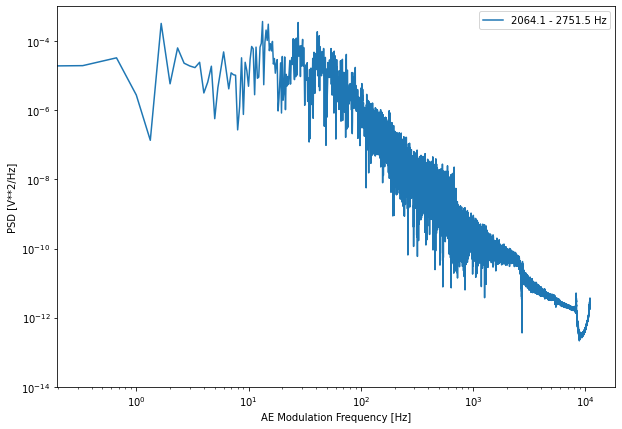

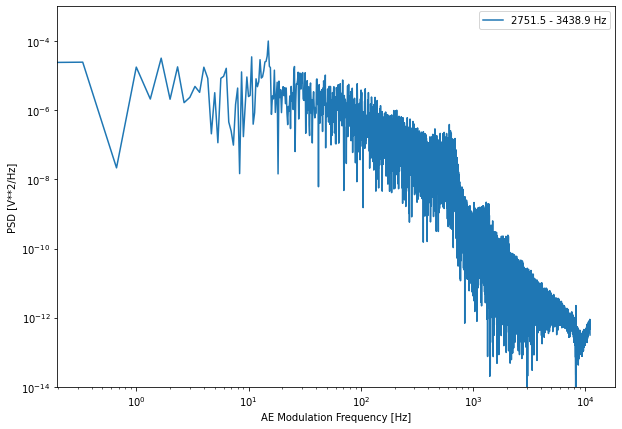

...

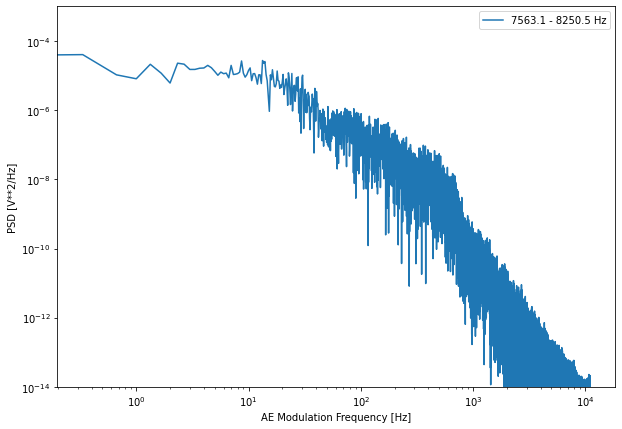

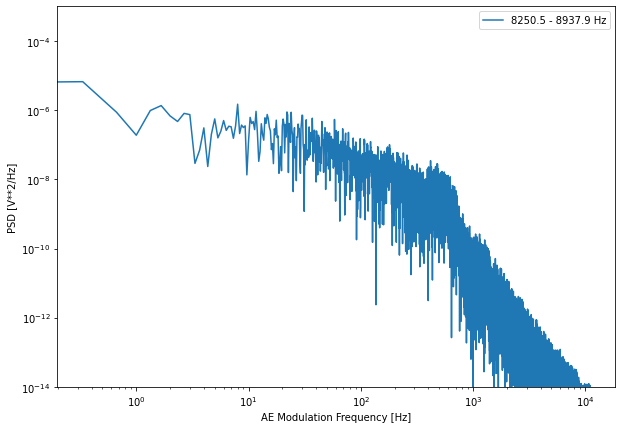

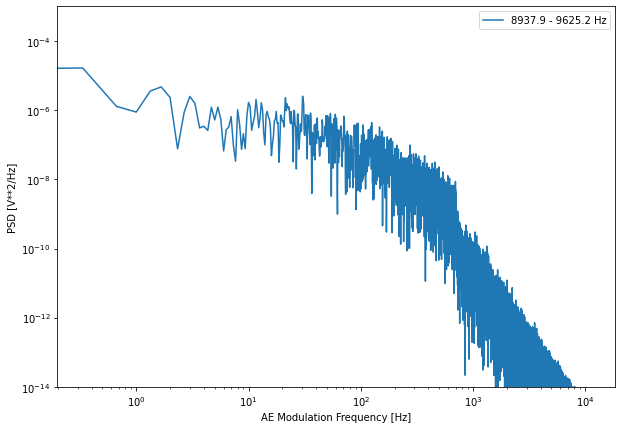

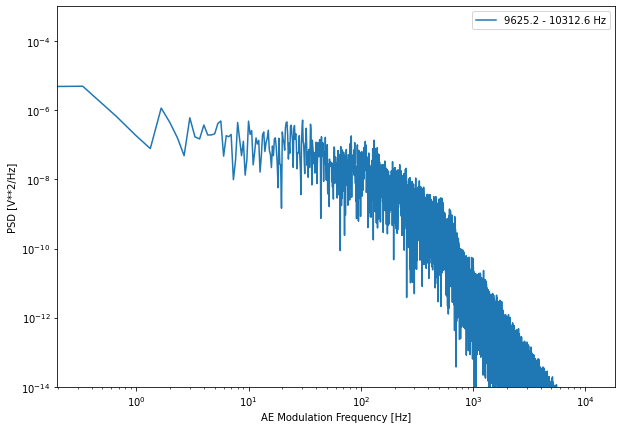

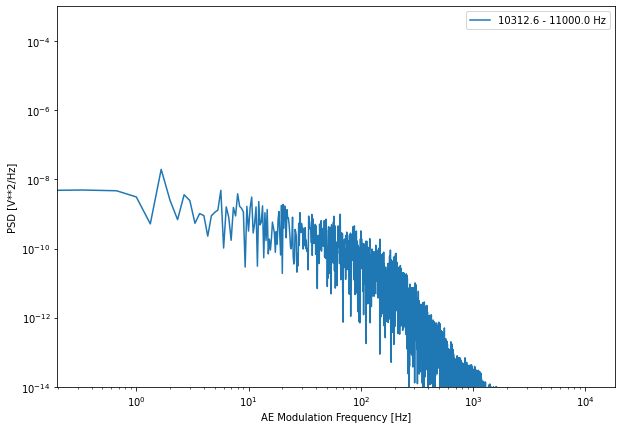

In [39]:

f_i=0
for ae in amp_env_P1:
  lowcut = freqs[f_i]
  highcut = freqs[f_i+1]
  f_psd,psd = sig.periodogram(ae,sr)
  plt.figure(figsize=(10,7))
  plt.plot(f_psd,psd,label=str(round(lowcut,1))+' - '+str(round(highcut,1))+' Hz')
  plt.xscale('log')
  plt.yscale('log')
  plt.xlabel('AE Modulation Frequency [Hz]')
  plt.ylabel('PSD [V**2/Hz]')
  #plt.xlim([1,500])
  plt.ylim([1e-14,1e-3])
  plt.legend()
  f_i+=1
  plt.show()

## 2.3 Bandstop AE using Butterworth bandstop filter

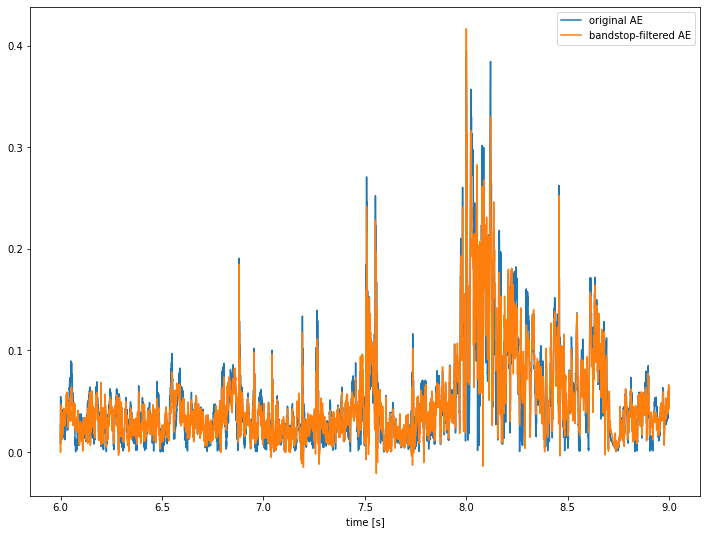

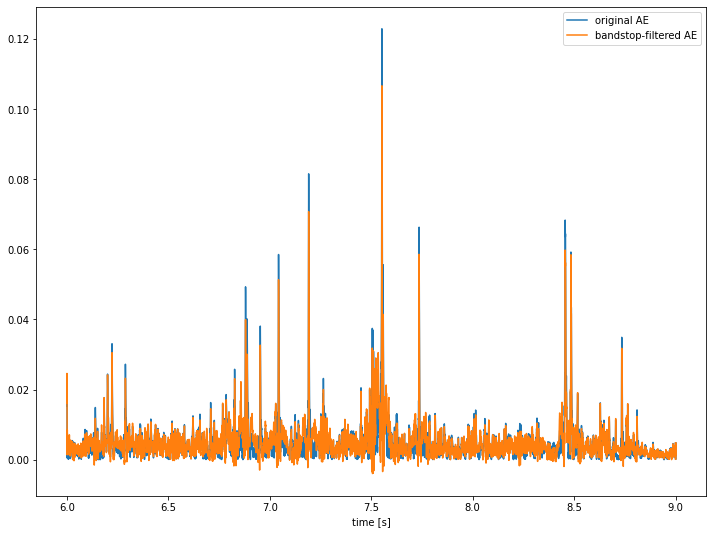

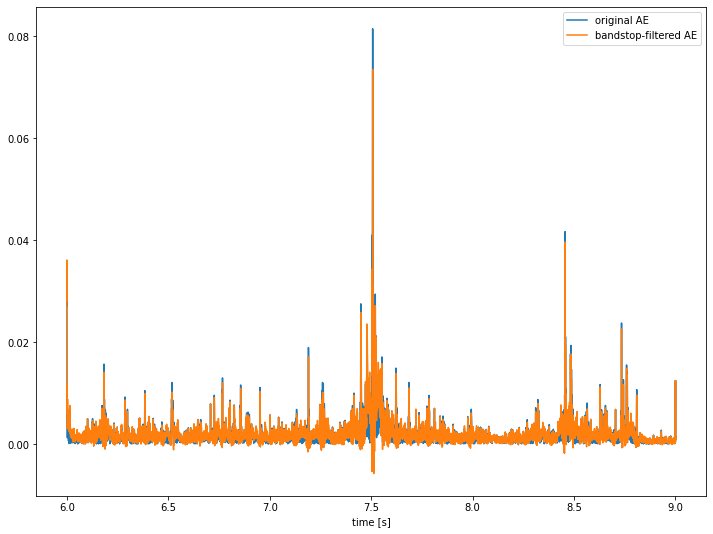

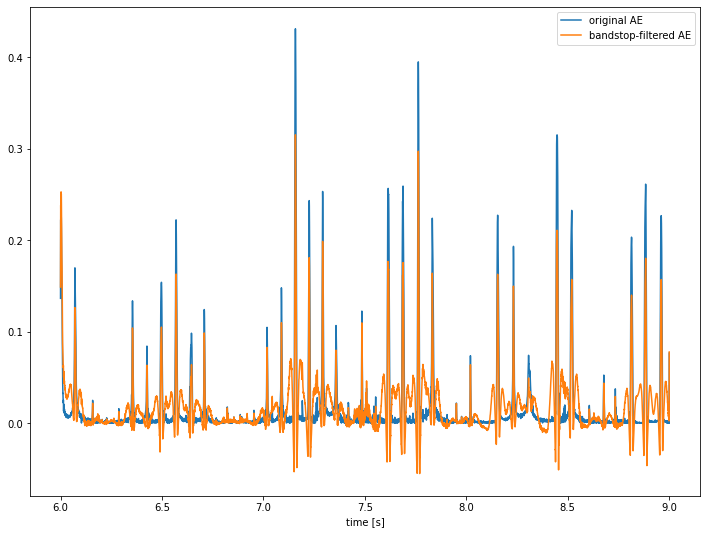

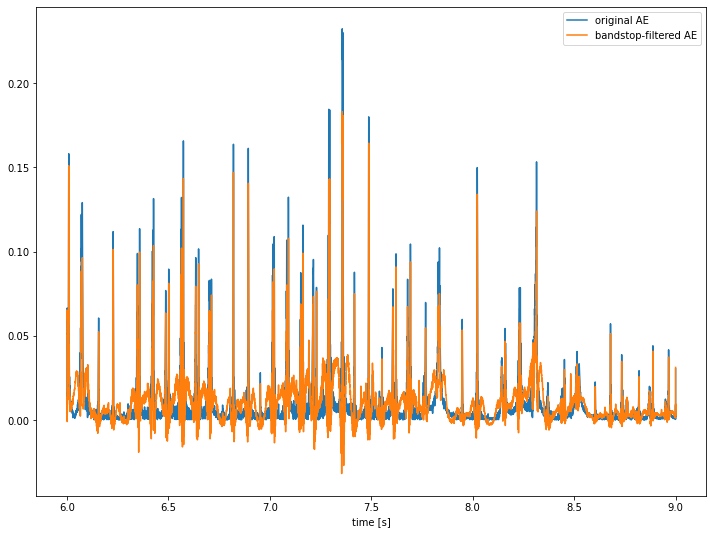

...

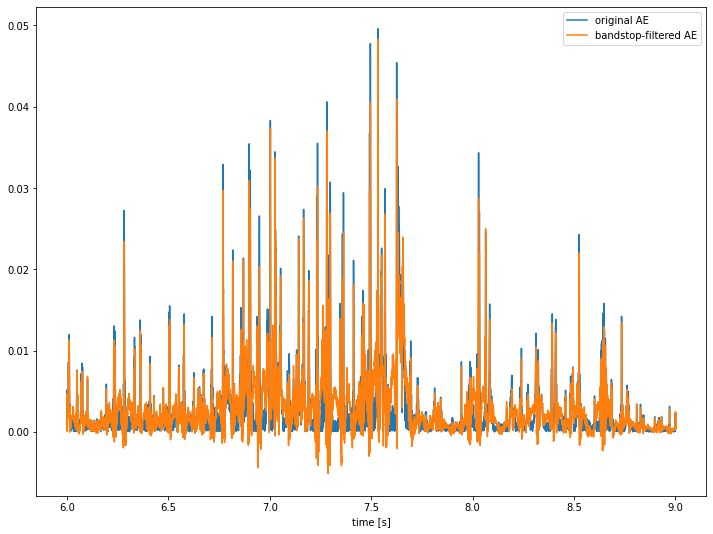

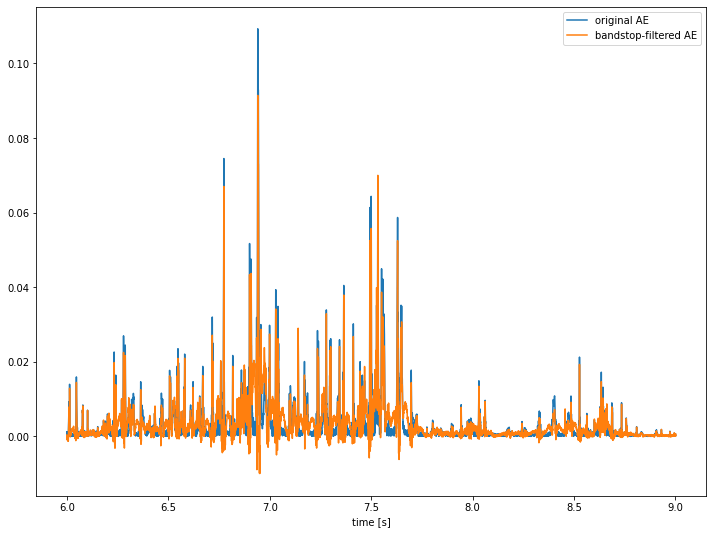

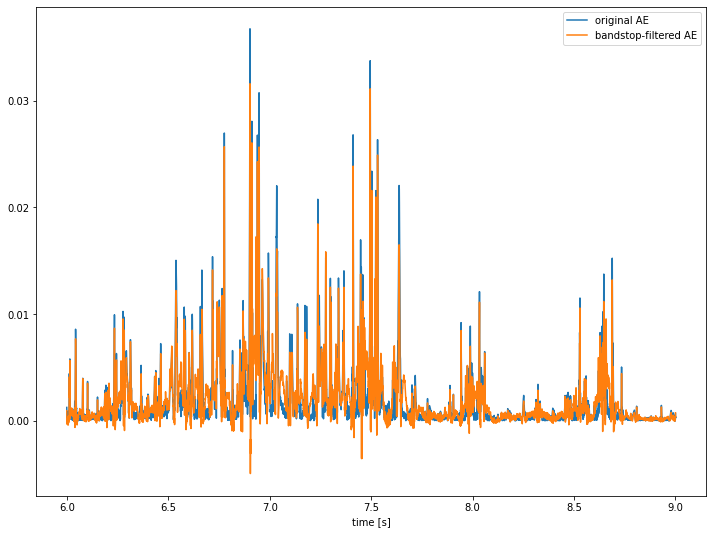

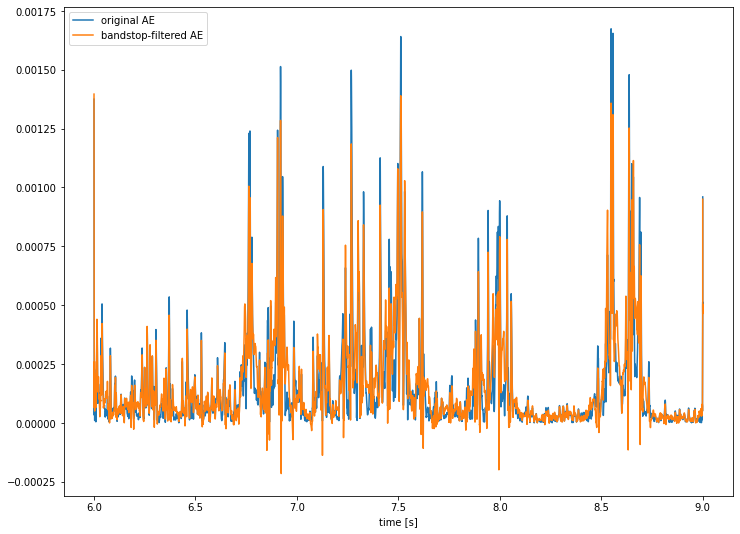

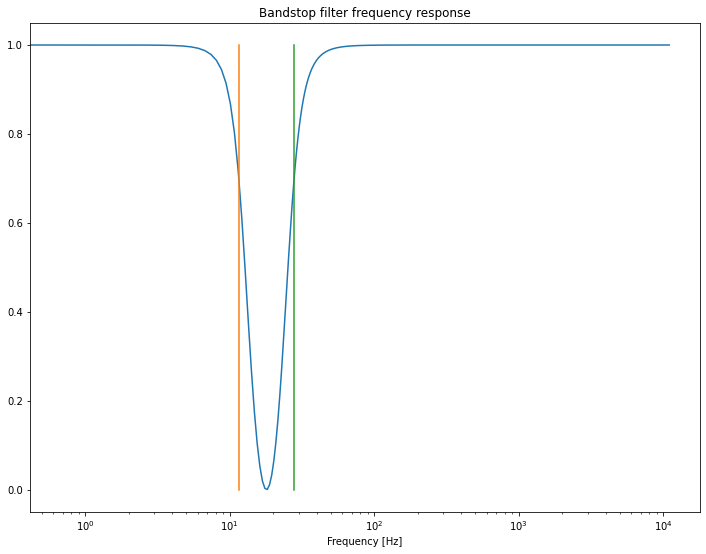

In [40]:
low_f = 11.5
high_f = 28

amp_env_filtered_P1=[]
for ae in amp_env_P1:
  #y, f, h = bandstop(ae,sr, 19.75, quality_factor=0.5)
  y , f ,h = butter_bandstop_filter(ae, low_f, high_f, sr, order=2)
  amp_env_filtered_P1.append(y)
  plt.figure(figsize=(12,9))
  plt.plot(t,ae, label='original AE')
  plt.plot(t,amp_env_filtered_P1[-1], label='bandstop-filtered AE')
  plt.legend()
  plt.xlabel('time [s]')
  plt.show()

plt.figure(figsize=(12,9))
plt.plot(f,abs(h))
#plt.plot(f,20*np.log10(abs(h)))
plt.plot([low_f,low_f],[0,1])
plt.plot([high_f,high_f],[0,1])
#plt.xlim([1050,1150])
plt.xlabel('Frequency [Hz]')
#plt.ylabel('Amplitude [dB]')
plt.xscale('log')
plt.title('Bandstop filter frequency response')
plt.show()

## 2.4 Half wave rectification


Filtering of the AE might introduce **negative amplitudes**. Perform a half-wave rectification, by setting to **zero all negative values**.

In [41]:
# define a function that does half-wave rectification
def half_rectify(signal):
  '''
  Half rectifies a signal: set all negative values to zero
  input: a signal in the form of a list/array
  output: rectified signal
  '''

  #signal = listmap(lambda x: 0 if x < 0 else x, signal)
  signal[signal<0] = 0
  return signal

In [42]:
# apply rectification in all filtered envelopes 
amp_env_filtered_rect_P1 = []

for envelope in amp_env_filtered_P1:
  amp_env_filtered_rect_P1.append(half_rectify(envelope))

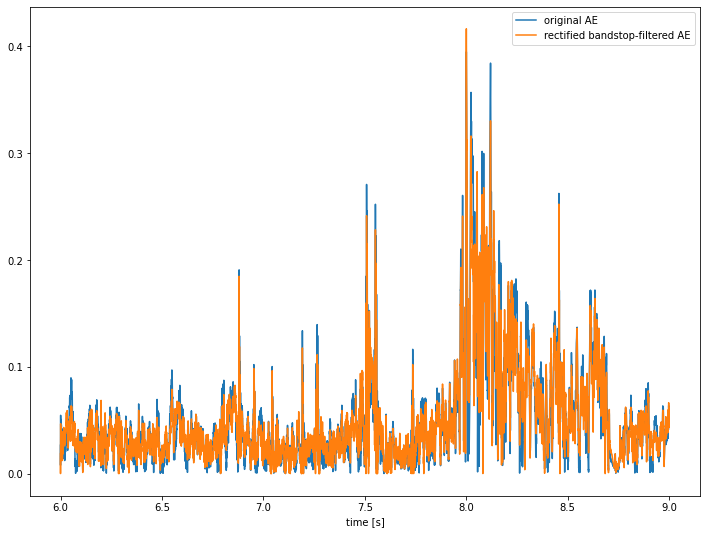

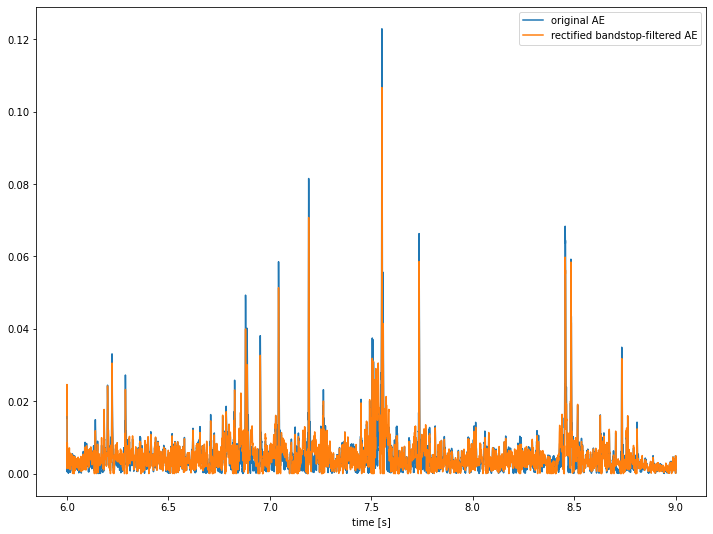

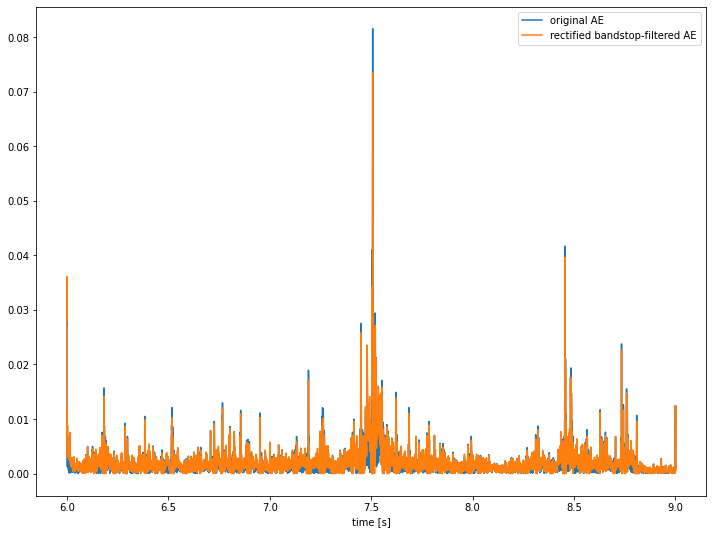

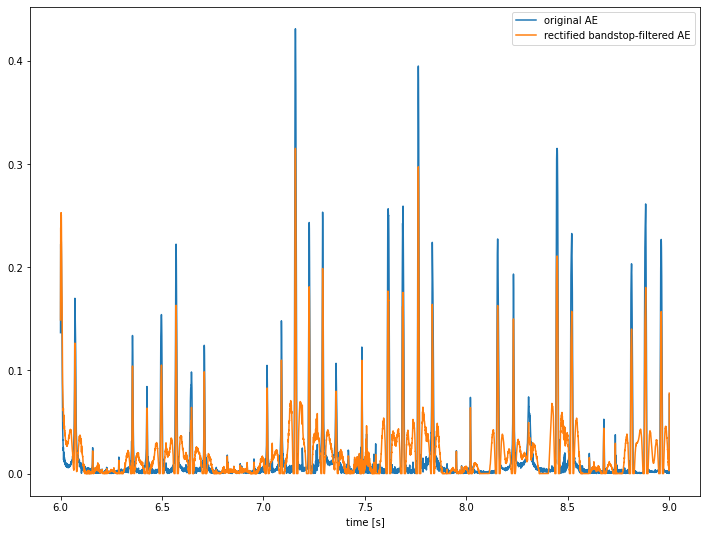

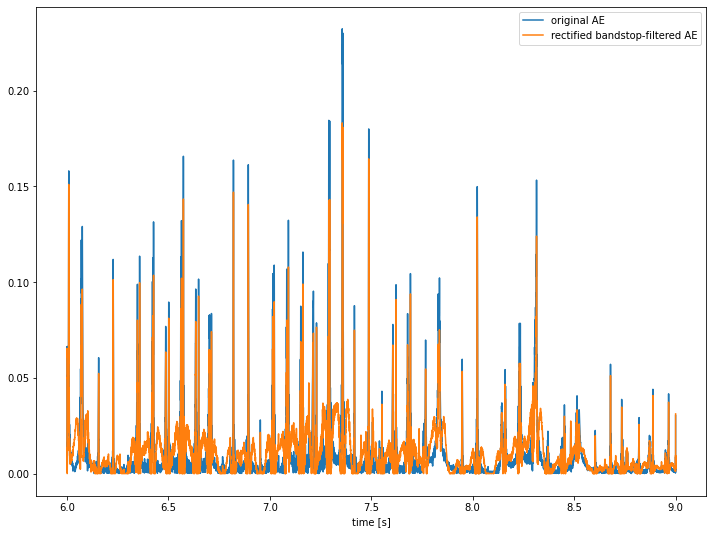

...

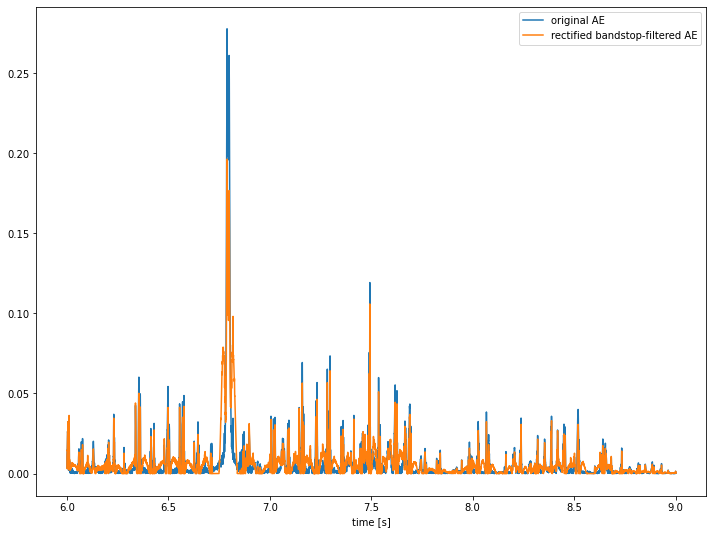

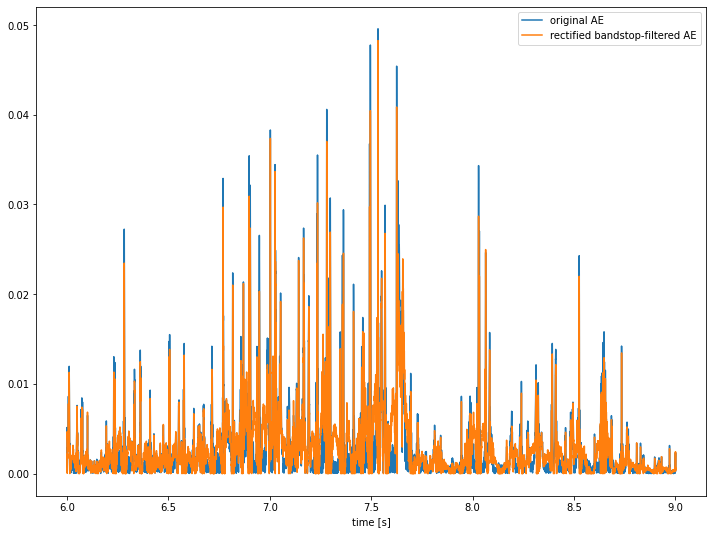

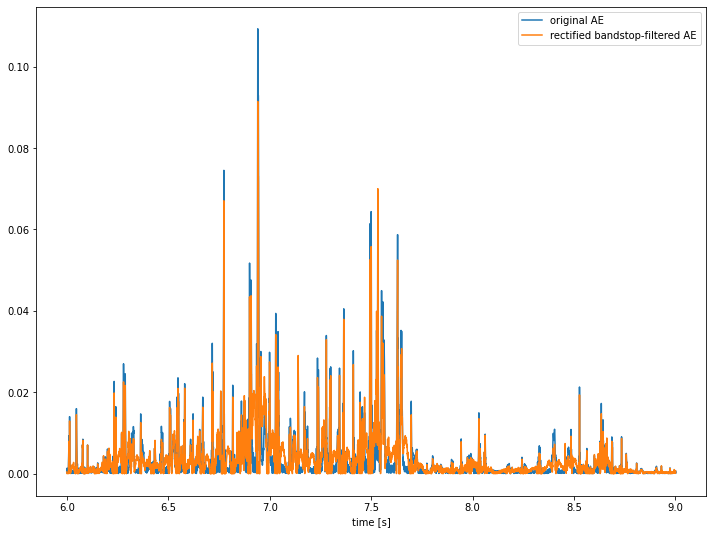

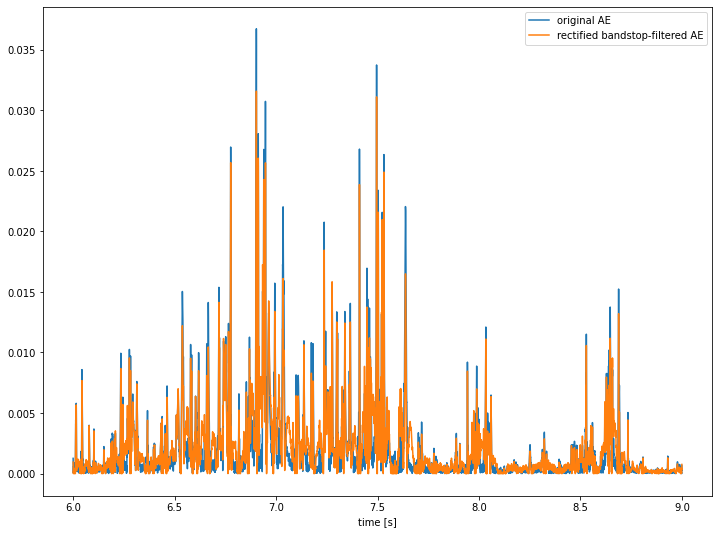

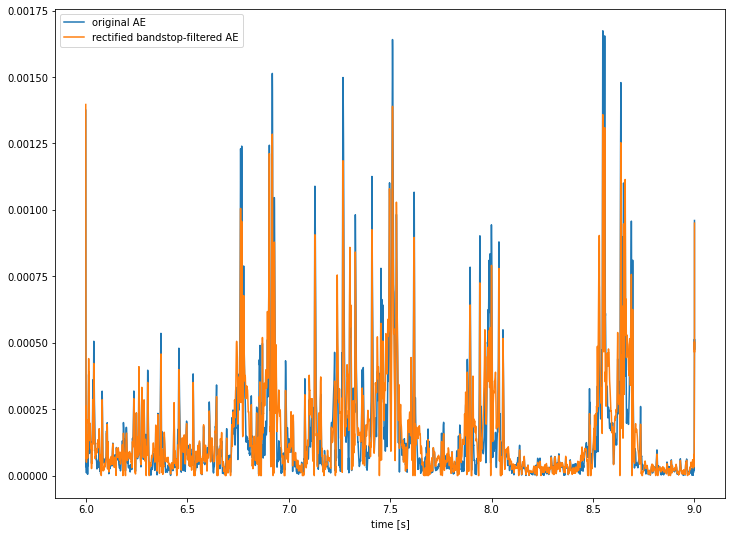

In [43]:
# check how the rectified AE look compared to original full band-signals

for i in range(len(amp_env_filtered_rect_P1)):
  plt.figure(figsize=(12,9))
  plt.plot(t,amp_env_P1[i],label='original AE')
  plt.plot(t,amp_env_filtered_rect_P1[i],label='rectified bandstop-filtered AE')
  plt.xlabel('time [s]')
  plt.legend()
  plt.show()

### 2.4.1 Power Spectral Density of filtered AE

For the full filtered wideband signal AE

🛑 Make PSD plots 'cleaner': use log binning, smoothing, whatever


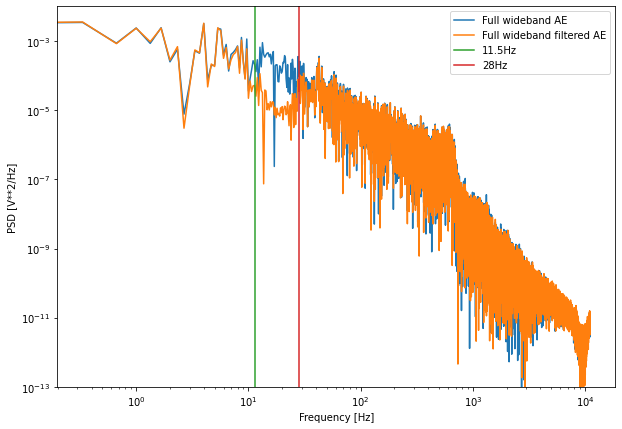

In [44]:
low_f=11.5
high_f=28

#full_amp_env = hilbert(signal)
full_amp_env_P1 = sum(amp_env_P1)
f_psd_o,psd_o = sig.periodogram(full_amp_env_P1,sr)

full_filt_amp_env_P1 = sum(amp_env_filtered_rect_P1)
f_psd_f,psd_f = sig.periodogram(full_filt_amp_env_P1,sr)

plt.figure(figsize=(10,7))
plt.plot(f_psd_o,psd_o,label='Full wideband AE')
plt.plot(f_psd_f,psd_f,label='Full wideband filtered AE')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
#plt.xlim([1,500])
plt.plot([low_f,low_f],[1e-14,1e-2],label = str(low_f)+'Hz')
plt.plot([high_f,high_f],[1e-14,1e-2],label = str(high_f)+'Hz')
plt.ylim([1e-13,1e-2])
plt.legend()
plt.show()

For filtered narrowband signals AE

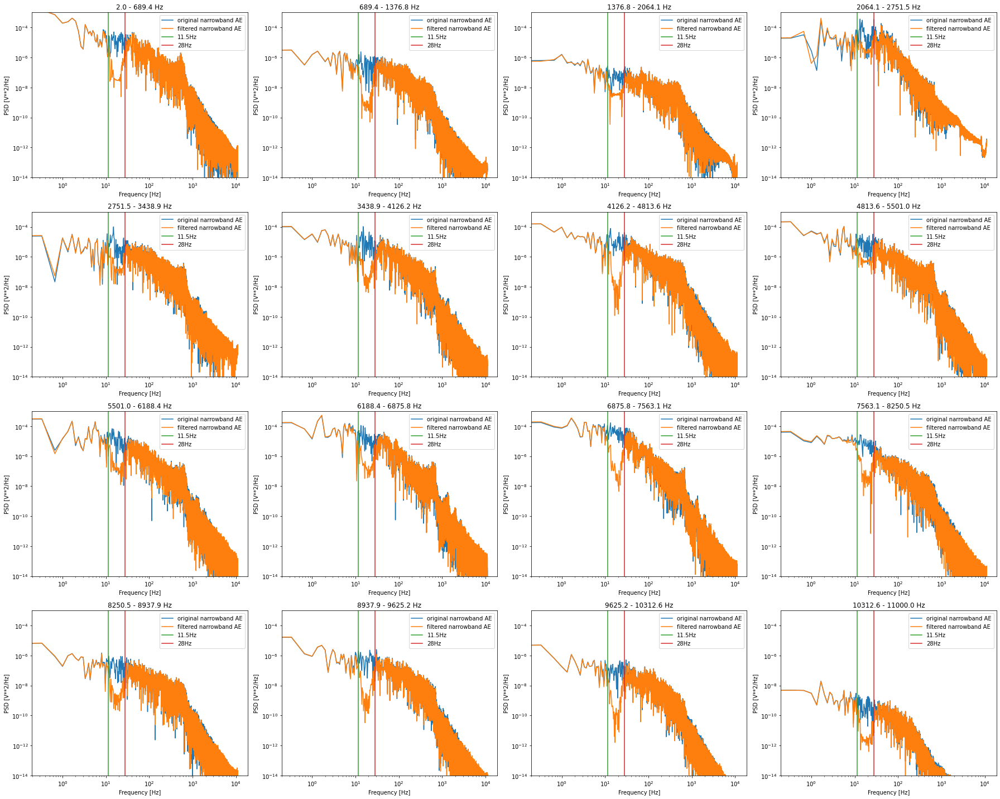

In [45]:

rows = 4
cols = 4
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(25, 20))

f_i=0
for j in range(len(amp_env_filtered_rect_P1)):

  r = j // cols
  c = j % cols
  ax = axes[r][c]
  lowcut = freqs[f_i]
  highcut = freqs[f_i+1]
  f_psd_o,psd_o = sig.periodogram(amp_env_P1[j],sr) # the original narrowband AE  
  f_psd_f,psd_f = sig.periodogram(amp_env_filtered_rect_P1[j],sr)  # the filtered narrowband AE 

  ax.plot(f_psd_o,psd_o,label='original narrowband AE')
  ax.plot(f_psd_f,psd_f,label='filtered narrowband AE')
  ax.plot([low_f,low_f],[1e-14,1e-3],label = str(low_f)+'Hz')
  ax.plot([high_f,high_f],[1e-14,1e-3],label = str(high_f)+'Hz')
  ax.set_xscale('log')
  ax.set_yscale('log')
  ax.set_xlabel('Frequency [Hz]')
  ax.set_ylabel('PSD [V**2/Hz]')
  ##plt.xlim([1,500])
  ax.set_ylim([1e-14,1e-3])
  ax.legend()
  ax.set_title(str(round(lowcut,1))+' - '+str(round(highcut,1))+' Hz')
  f_i+=1
  
fig.tight_layout()  
plt.show()

## 2.5 Modify original BP signal with new envelope

In [46]:
envR_P1  = [i / j for i, j in zip(amp_env_filtered_rect_P1 , amp_env_P1)] # calculate the ratio
filt_bp_signalP1 = [ i * j for i,j in zip(bp_signalP1, envR_P1)] # multiply original audio with ratio


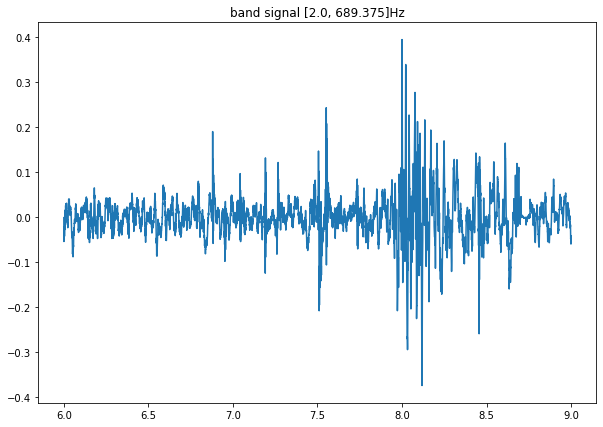

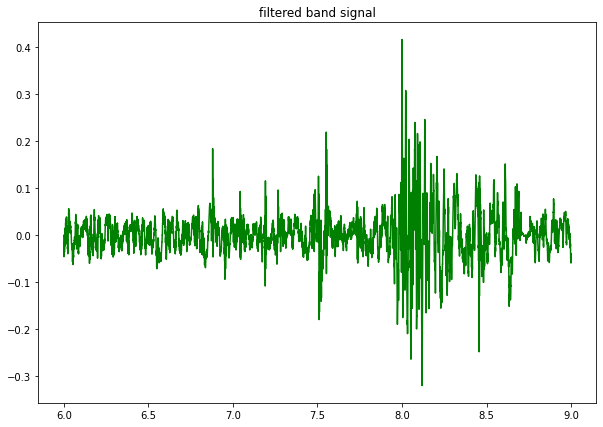

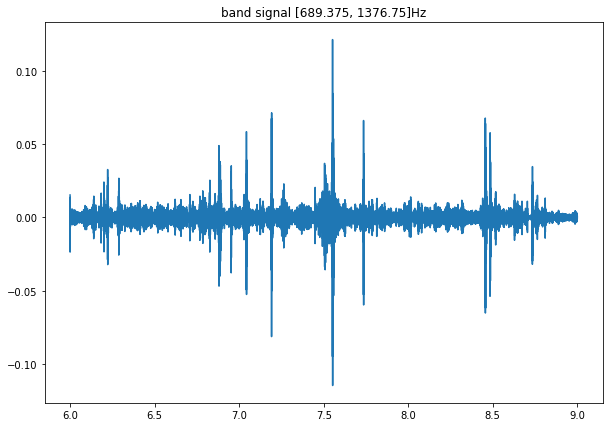

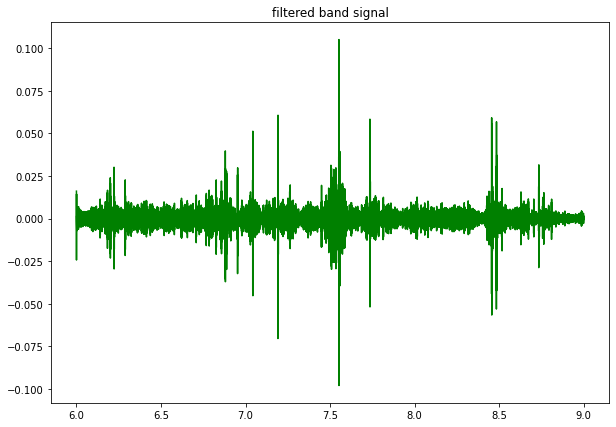

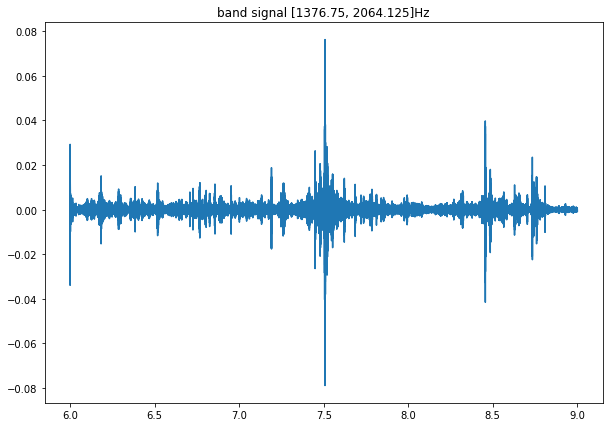

...

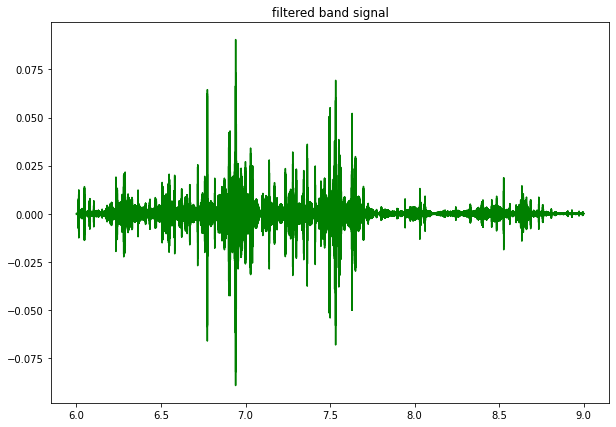

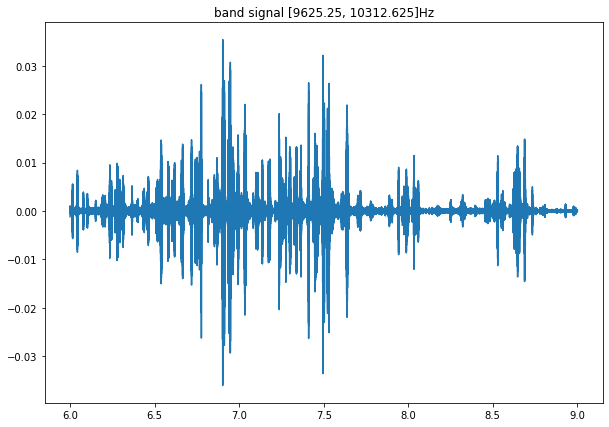

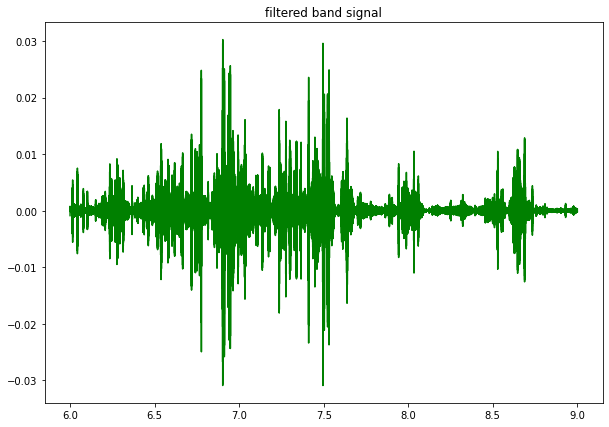

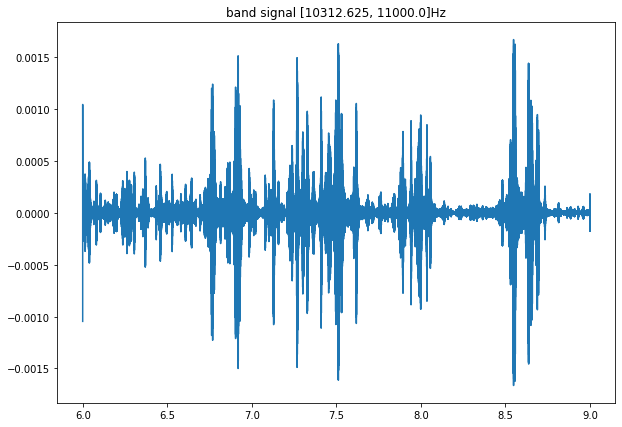

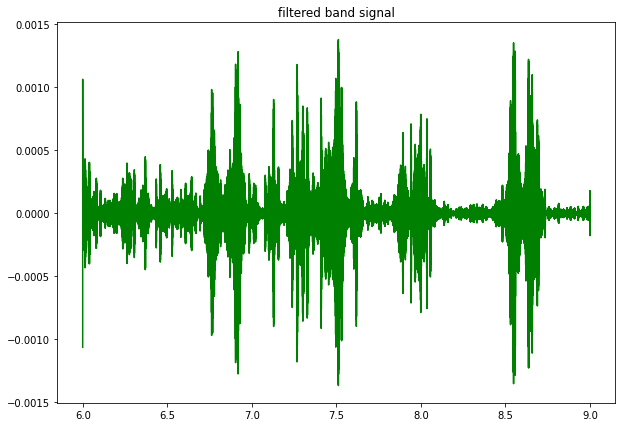

In [47]:

for i in range(len(filt_bp_signalP1)):
  
  plt.figure(figsize=(10,7))
  plt.title(f'band signal {[freqs[i] , freqs[i+1]]}Hz')
  plt.plot(t,bp_signalP1[i])
  plt.show()

  plt.figure(figsize=(10,7))
  plt.title('filtered band signal')
  plt.plot(t,filt_bp_signalP1[i],c='g')
  plt.show()

  #plt.figure(figsize=(10,7))
  #plt.plot(np.cos(inst_phase_o[i])*amp_env_filtered_rect[i],c='r') # sanity check: multiplying the new filtered AE with original phase, is the same as multiplying AE ratio with original signal
  #plt.show()


## 2.6 Bandpass modified band signals


⚰  **BETTER AVOID THIS STEP AT THE TIME BEING**

2.0 689.375


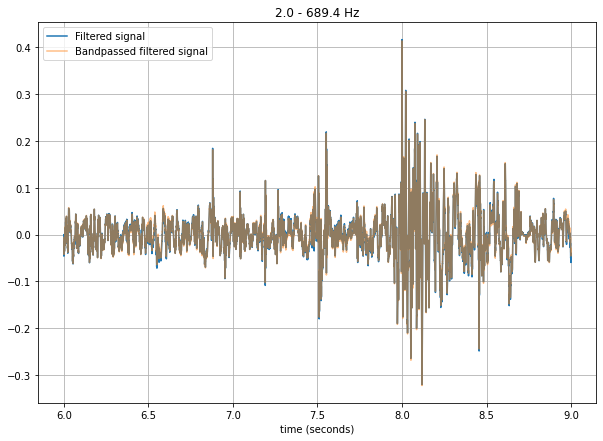

689.375 1376.75


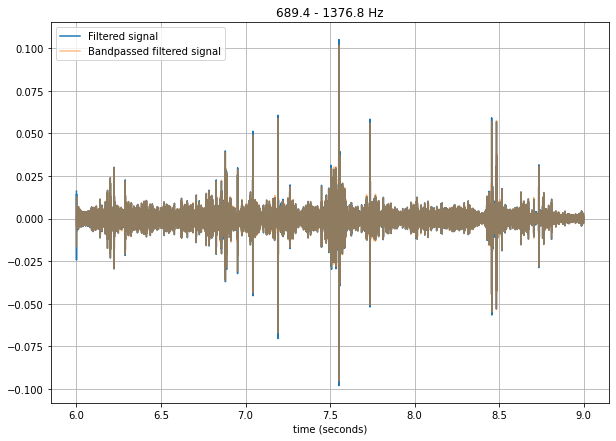

1376.75 2064.125


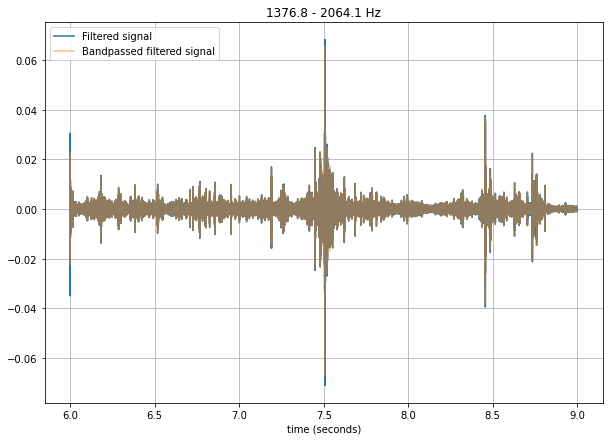

2064.125 2751.5


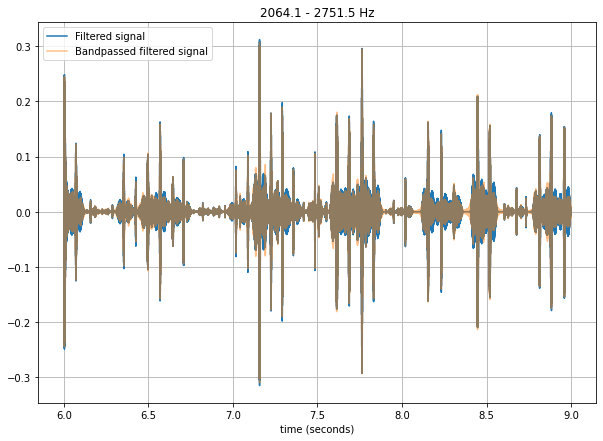

2751.5 3438.875


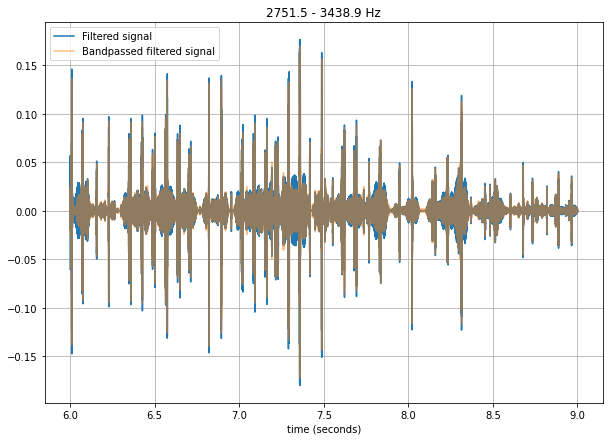

3438.875 4126.25


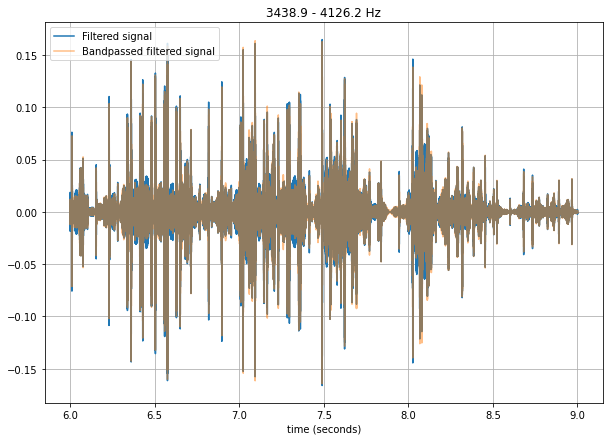

4126.25 4813.625


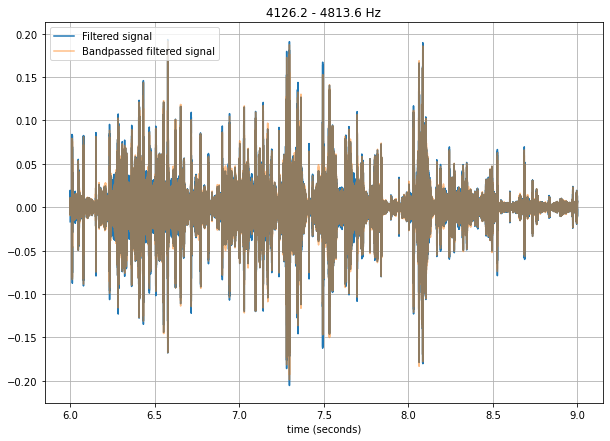

4813.625 5501.0


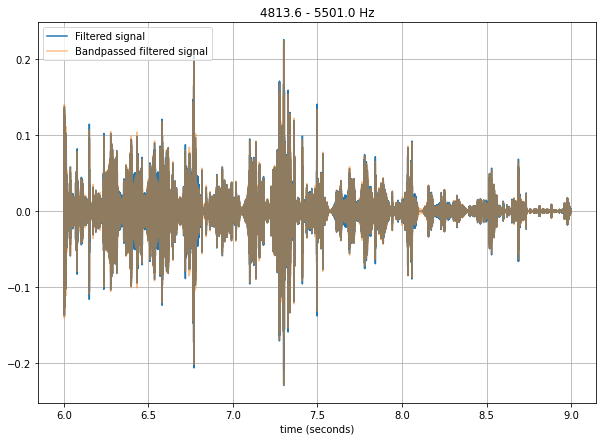

5501.0 6188.375


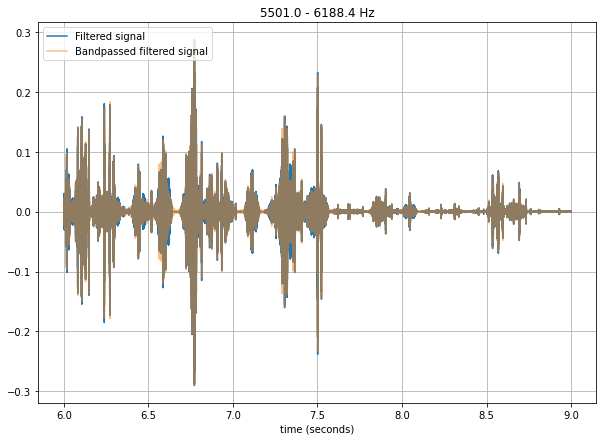

6188.375 6875.75


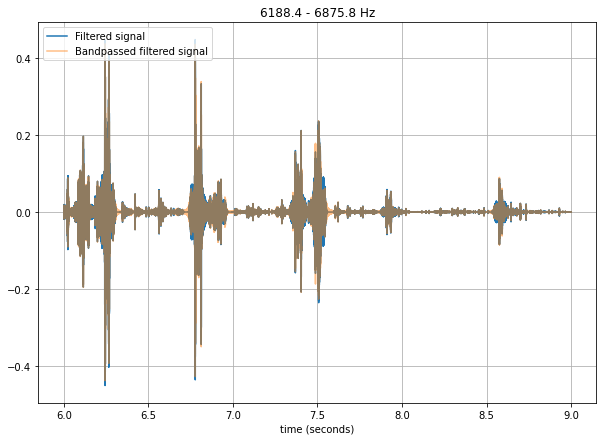

6875.75 7563.125


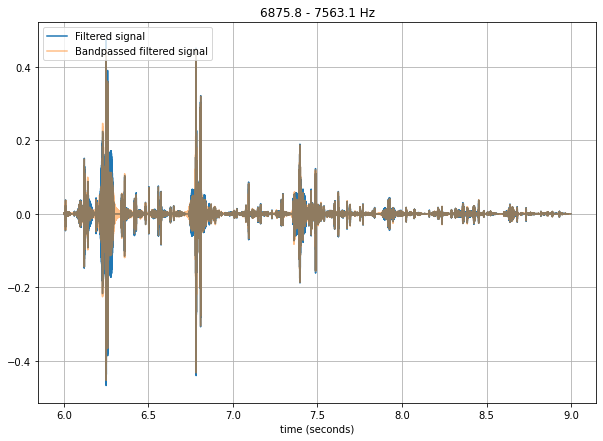

7563.125 8250.5


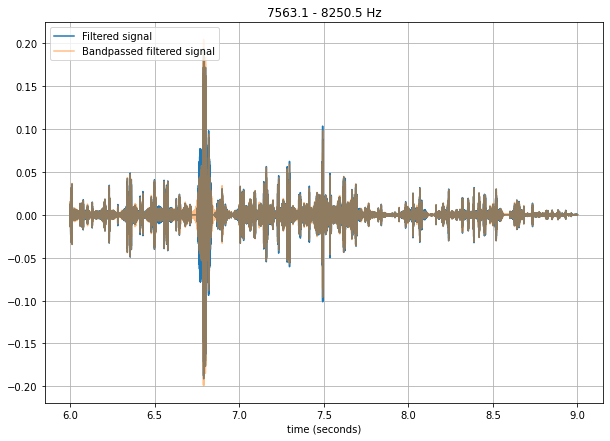

8250.5 8937.875


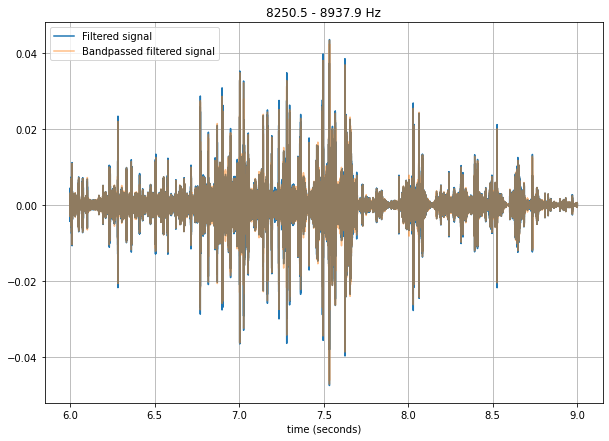

8937.875 9625.25


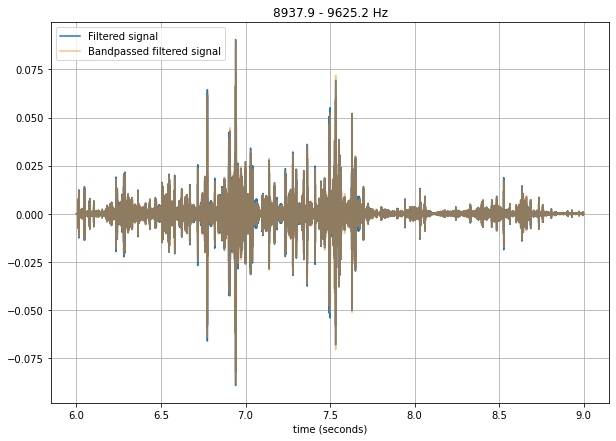

9625.25 10312.625


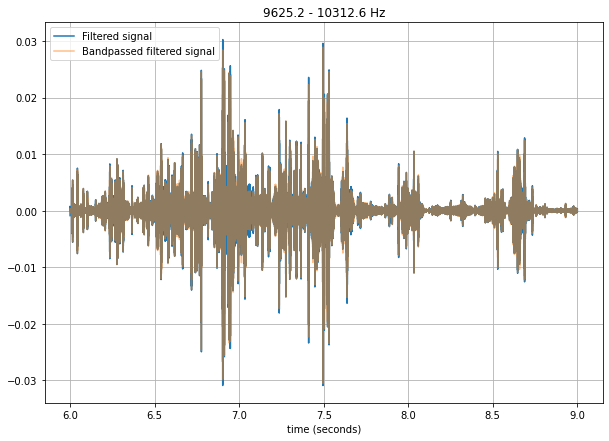

10312.625 11000.0


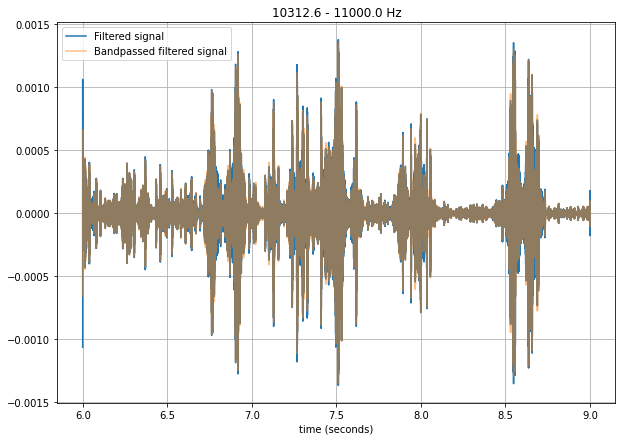

In [48]:
bp_filt_bp_signalP1= []

for i in range(len(freqs)-1):
  lowcut = freqs[i]
  highcut = freqs[i+1]
  print(lowcut,highcut)
  bp_filt_bp_signalP1.append(bandpass(filt_bp_signalP1[i], sr, lowcut, highcut, bandwidth=10,ripple_db=50))

  plt.figure(figsize=(10,7))
  plt.clf() 
  plt.plot(t, filt_bp_signalP1[i], label='Filtered signal')
  plt.plot(t, bp_filt_bp_signalP1[i], label='Bandpassed filtered signal',alpha=0.5)
  plt.xlabel('time (seconds)')
  plt.grid(True)
  plt.axis('tight')
  #plt.ylim([-1,1])
  plt.legend(loc='upper left')
  plt.title(str(round(lowcut,1))+' - '+str(round(highcut,1))+' Hz')
  plt.show()


## 2.7 Sum all modified bandpass signals

Sum ... 

In [52]:

# USE SECOND BANDPASS FILTER: uncomment following line and comment all else 
mod_signalP1=sum(bp_filt_bp_signalP1)

# DO NOT USE SECOND BANDPASS FILTER: uncomment following line and comment all else 
#mod_signalP1=sum(filt_bp_signalP1)

# DO NOT USE ANY FILTERING: uncomment following line and comment all else
#mod_signalP1=sum(bp_signalP1)

... and plot original full signal and modified full signal comparisons. Calculate and plot the diff between the two signals as well.

**NOTE: at the moment these plots are not very illuminating. I am assuming that minor phase shift is creating the high diff.**

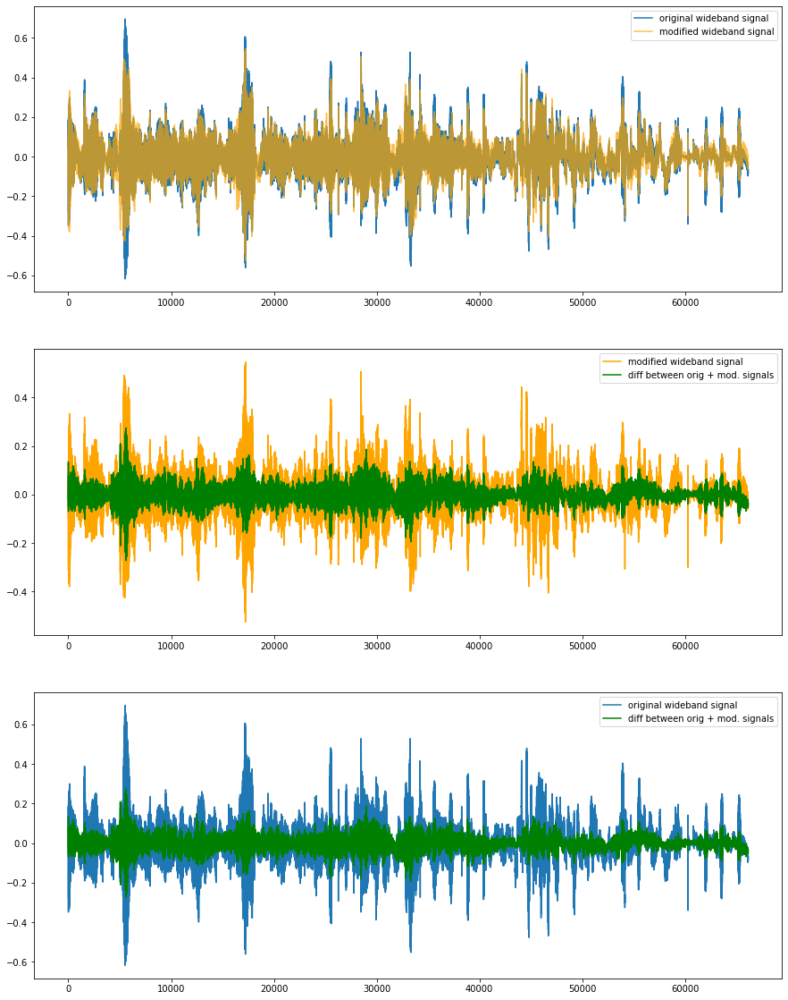

In [53]:

fig, ax = plt.subplots(nrows=3, sharex=False,gridspec_kw={'height_ratios': [1, 1,1]},figsize=(15,20))


ax[0].plot(signalP1,label='original wideband signal')
ax[0].plot(mod_signalP1,label='modified wideband signal',alpha=0.7,c='orange')
ax[0].legend()

#ax[1].plot(signal-mod_signal,label='diff between orig + mod. signals',c='g')
ax[1].plot(mod_signalP1,label='modified wideband signal',c='orange')
ax[1].plot(signalP1-mod_signalP1,label='diff between orig + mod. signals',c='g')
ax[1].legend()

#ax[2].plot(signal-mod_signal,label='diff between orig + mod. signals',c='g')
ax[2].plot(signalP1,alpha=1.0,label='original wideband signal')
ax[2].plot(signalP1-mod_signalP1,label='diff between orig + mod. signals',c='g')
ax[2].legend()

plt.show()




## 2.8 Comparisons

### 2.8.1 Compare modulation spectrograms

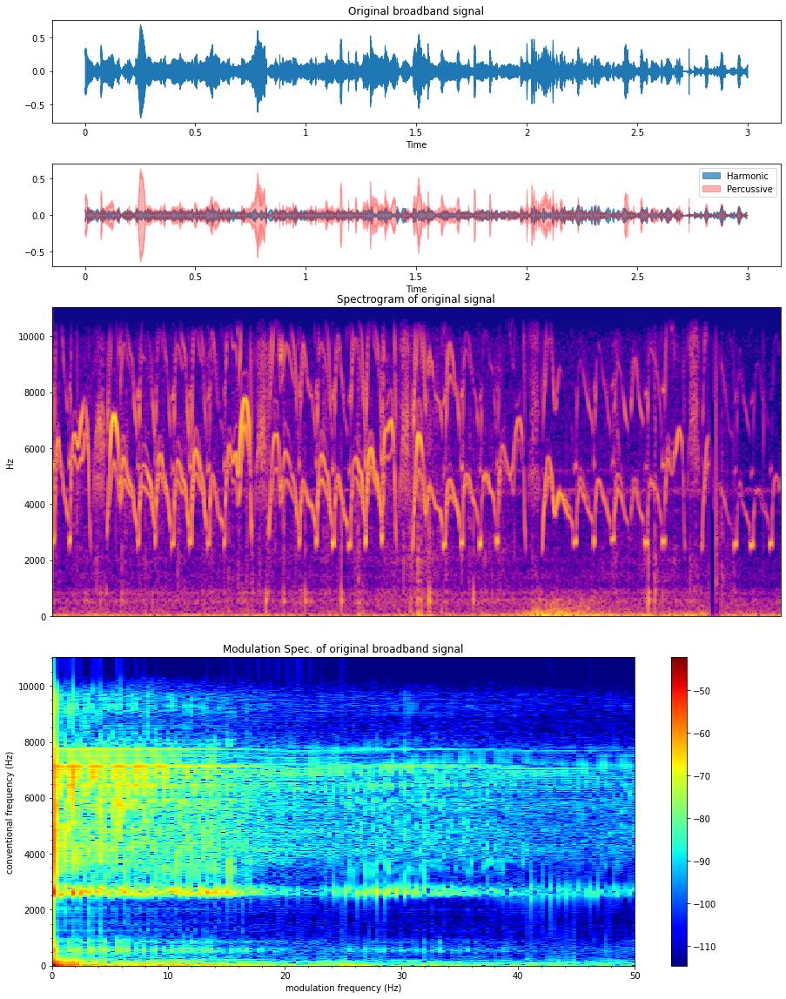

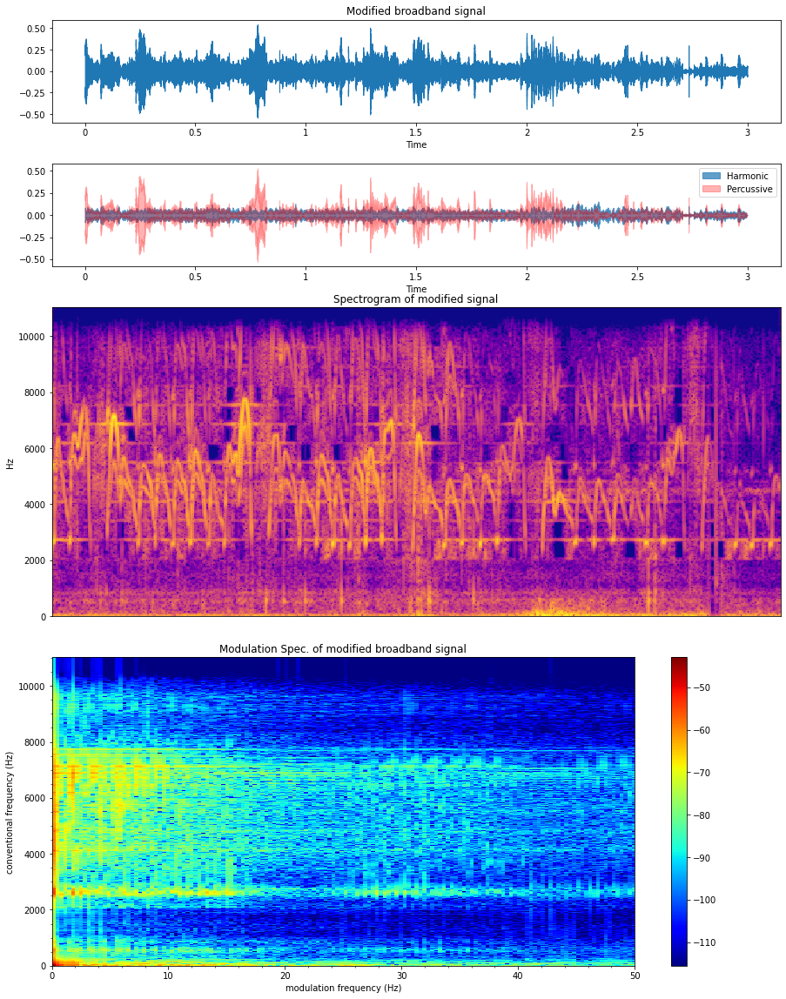

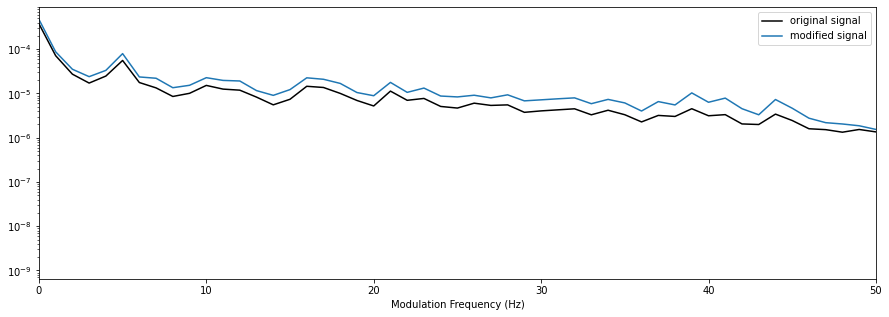

In [54]:
window_size = 1024
window_shift = 16

#Original signal

y_harm, y_perc = librosa.effects.hpss(signalP1)
stft = librosa.stft(signalP1,n_fft=512,hop_length=128)

spec_power = np.abs(stft)**2
p_to_db = librosa.power_to_db(spec_power)
modul_spec_orig=np.sum(rfft_mod['power_modulation_spectrogram'],axis=0)

ama_input = signalP1

rfft_mod = ama.strfft_modulation_spectrogram(ama_input,
                                             sr,
                                             window_size,
                                             window_shift,
                                             channel_names=' ',
                                             win_function_y='boxcar',
                                             win_function_x='boxcar')


fig, ax = plt.subplots(nrows=4, sharex=False,gridspec_kw={'height_ratios': [1, 1,3, 3]},figsize=(15,20))

librosa.display.waveshow(signalP1, sr=sr, ax=ax[0])
librosa.display.waveshow(y_harm, sr=sr, alpha=0.7,  label='Harmonic',ax=ax[1])
librosa.display.waveshow(y_perc, sr=sr, color='r', alpha=0.3, label='Percussive',ax=ax[1])
librosa.display.specshow(p_to_db, sr=sr,y_axis='linear',ax = ax[2], cmap='plasma')

ama.plot_modulation_spectrogram_data(rfft_mod, c_map='jet')#,modf_range=[1,40])

ax[0].set_title('Original broadband signal')
ax[2].set_title('Spectrogram of original signal')
ax[3].set_title('Modulation Spec. of original broadband signal')
ax[3].set_xlim([0,50])
ax[1].legend()
plt.show()


# Modified signal

y_harm, y_perc = librosa.effects.hpss(mod_signalP1)
stft = librosa.stft(mod_signalP1,n_fft=512,hop_length=128)
spec_power = np.abs(stft)**2
p_to_db = librosa.power_to_db(spec_power)
modul_spec_mod=np.sum(rfft_mod['power_modulation_spectrogram'],axis=0)


ama_input = mod_signalP1

rfft_mod = ama.strfft_modulation_spectrogram(ama_input,
                                             sr,
                                             window_size,
                                             window_shift,
                                             channel_names=' ',
                                             win_function_y='boxcar',
                                             win_function_x='boxcar')


fig, ax = plt.subplots(nrows=4, sharex=False,gridspec_kw={'height_ratios': [1, 1,3, 3]},figsize=(15,20))

librosa.display.waveshow(mod_signalP1, sr=sr, ax=ax[0])
librosa.display.waveshow(y_harm, sr=sr, alpha=0.7,  label='Harmonic',ax=ax[1])
librosa.display.waveshow(y_perc, sr=sr, color='r', alpha=0.3, label='Percussive',ax=ax[1])
librosa.display.specshow(p_to_db, sr=sr,y_axis='linear',ax = ax[2], cmap='plasma')

ama.plot_modulation_spectrogram_data(rfft_mod, c_map='jet')#,modf_range=[1,40])

ax[0].set_title('Modified broadband signal')
ax[2].set_title('Spectrogram of modified signal')
ax[3].set_title('Modulation Spec. of modified broadband signal')
ax[1].legend()
ax[3].set_xlim([0,50])
plt.show()



print('\n')
print('\n')
print('\n')

plt.figure(figsize=(15,5))
plt.plot(modul_spec_orig,c='k',label='original signal')
plt.plot(modul_spec_mod,label = 'modified signal')
plt.yscale('log')
plt.xlabel('Modulation Frequency (Hz)')
plt.xlim([0,50])
plt.legend()
plt.show()

### 2.8.2 Compare audio before and after

In [55]:
print('ORIGINAL PARASITE AUDIO')

Audio(data=signalP1,rate=sr)



ORIGINAL PARASITE AUDIO


In [56]:
print('MODIFIED (i.e. FILTERED) PARASITE AUDIO')

Audio(data=mod_signalP1,rate=sr)

MODIFIED (i.e. FILTERED) PARASITE AUDIO


### 2.8.3 Save filtered file as wav file

In [ ]:
# Give a name for the file to be saved
save_name = 'filteredP1.wav'

# write file (if in colab, remember to download it before leaving the session)
sf.write(save_name, mod_signalP1, sr)

# 3 **Modulation enhancement** (Implant removed signal to Single Host 1)

These are the steps followed below, in order to restore the frequencies which were removed during the amplitude envelope modulation filtering process above.

1) Get the difference `sig_removed_P1` between the bank-filtered AEs of the original signal `amp_env_P1` and their modulation-filtered counterparts `amp_env_filtered_P1`


2) Bank-filter the Host Signal `signalSH1`. Resulting list of arrays is `bp_signalSH1`

3) Find the Amplitute Envelope for each of these frequency bands. Resulting list of arrays is `amp_env_SH1 `

4) Implant `sig_removed_P1` (i.e. removed signal from Parasite) into the signal of the Single Host. Two possible ways to do that: a) in time-domain, b)in frequency domain. Here solution a) is implemented.

> 4a) Add the removed signal `sig_removed_P1` to `amp_env_SH1`

5) Put together the full final wideband Host signal: multiply the ratio of the constructed AE to the Single Host AE  with the Single Host signal (`bp_signalSH1`)  (for each frequency band). Then sum up all frequency bands. This gives the final `constructed_signal`.

6) Finally, take a look at spectrograms and listen to the audios

## 3.1 Difference between bank-filtered AE and modulation-filtered bank-filtered AE

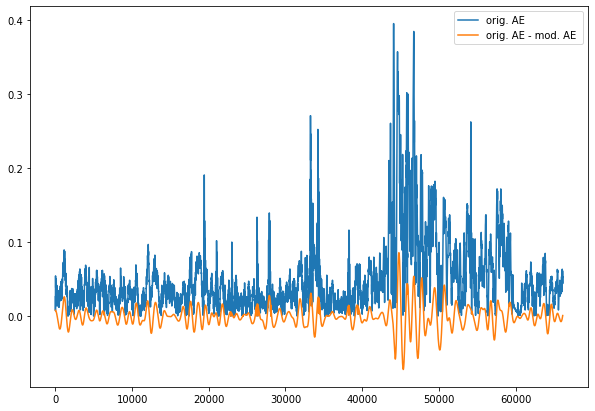

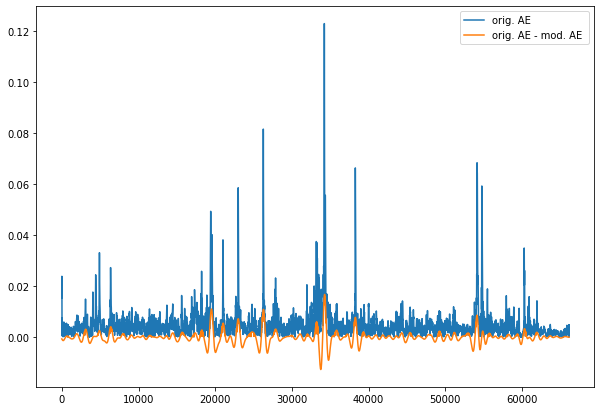

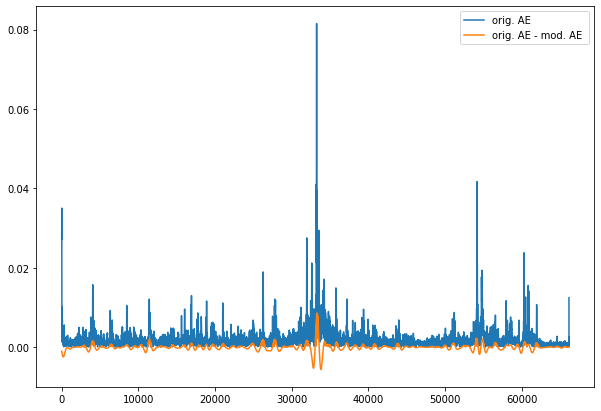

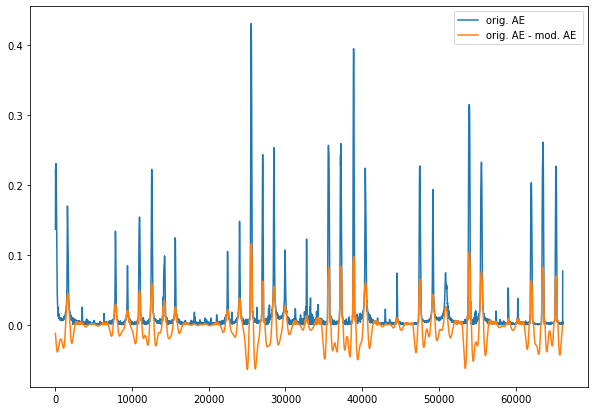

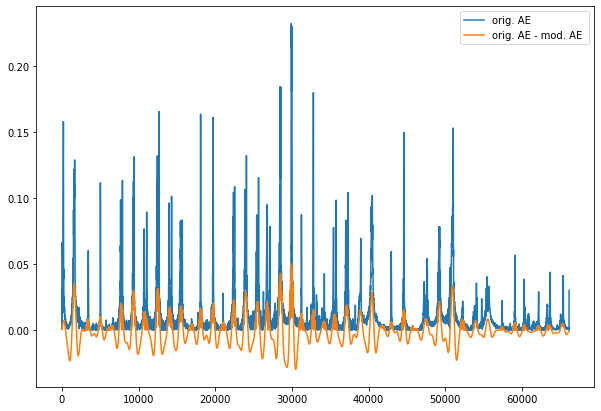

...

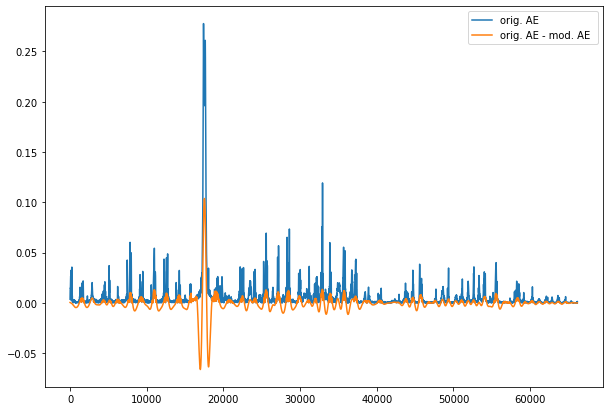

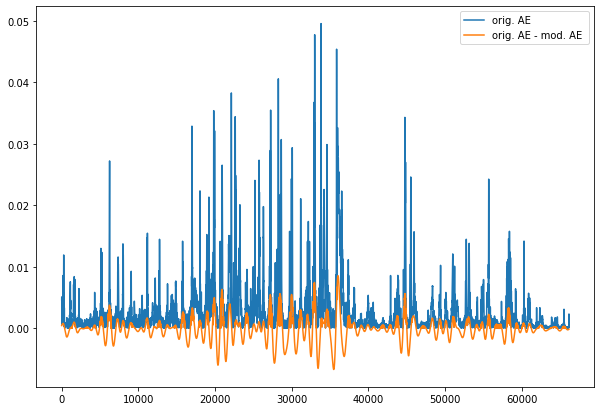

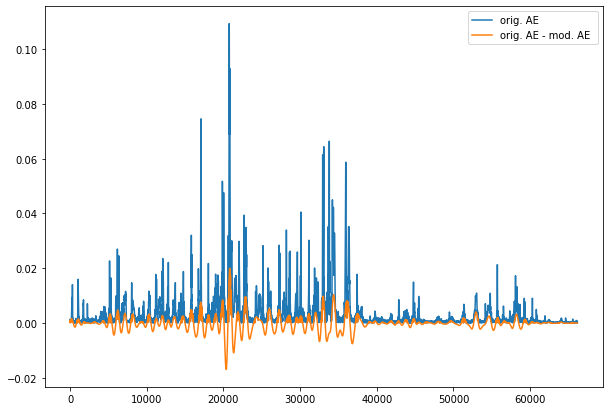

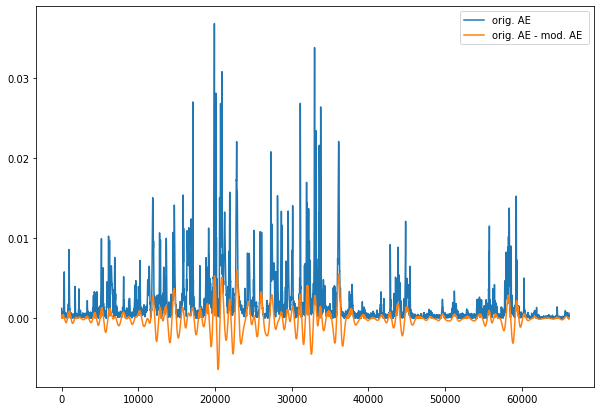

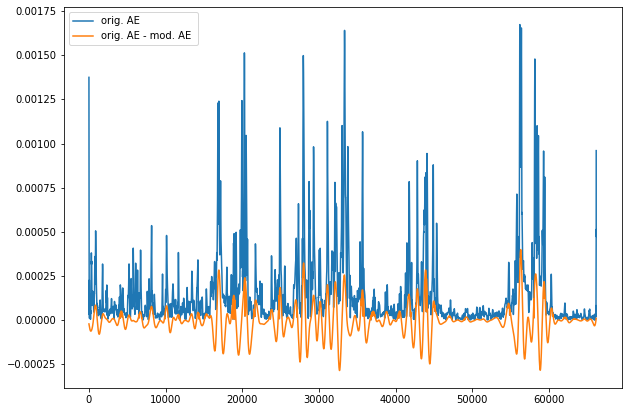

In [57]:
# this is the difference (in the time-amplitude domain) between the original  signal and the bandstoped signal from Section 2
# (i.e. signal with specific frequencies removed) for each frequency band

sig_removed = np.subtract(amp_env_P1, amp_env_filtered_P1)
#sig_removed = np.subtract(amp_env_P1, amp_env_filtered_rect_P1)



for i in range(len(sig_removed)):
  plt.figure(figsize=(10,7))
  plt.plot(amp_env_P1[i],label='orig. AE')
  plt.plot(sig_removed[i],label='orig. AE - mod. AE ')
  plt.legend()
  plt.show()

Do we need to half-rectify the diff signal??

In [58]:
# apply rectification in all diff envelopes 
sig_removed_rect = []

for envelope in sig_removed:
  sig_removed_rect.append(half_rectify(envelope))

### 3.1.1 PSD of the diff signal

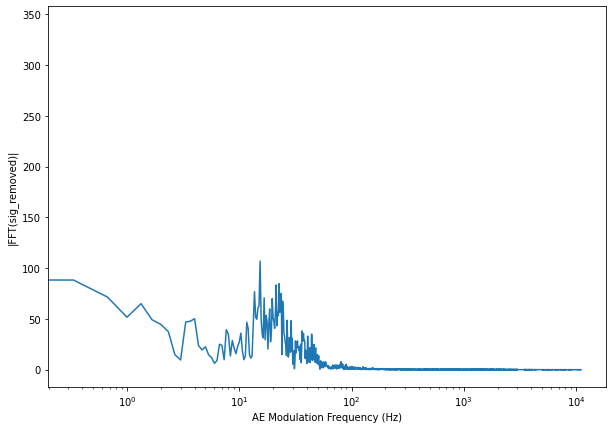

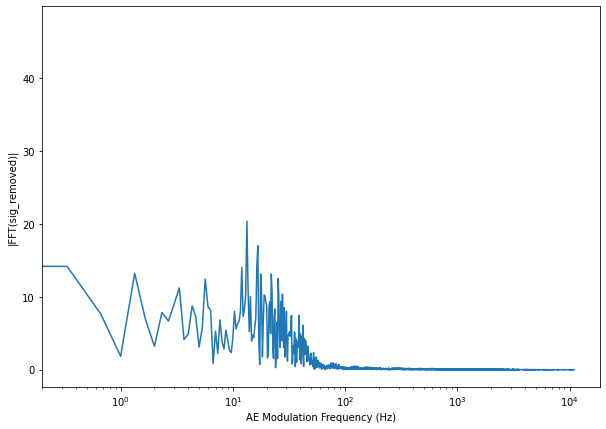

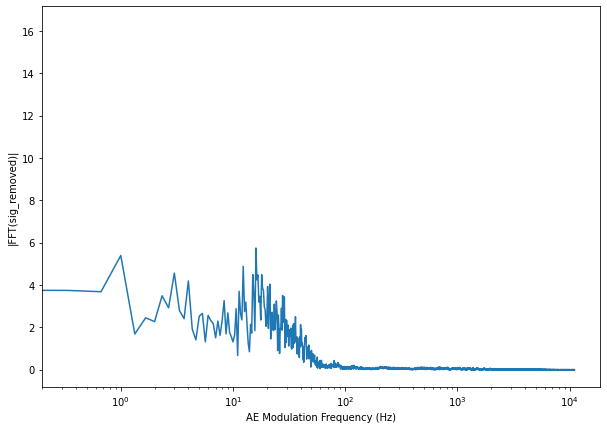

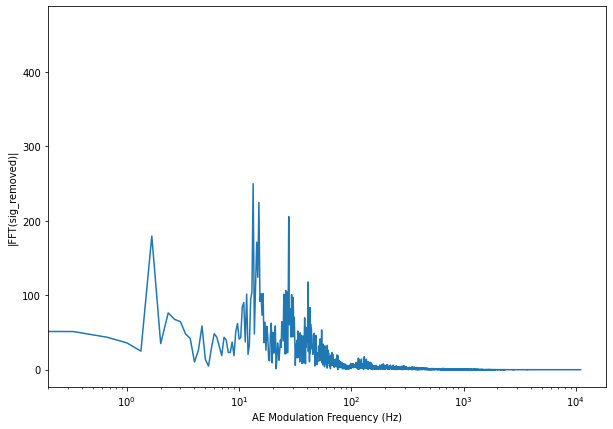

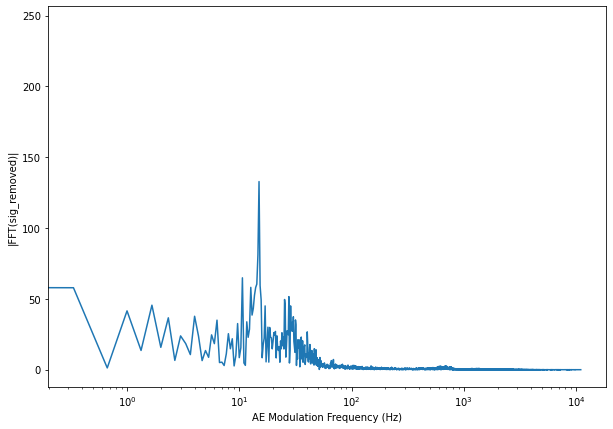

...

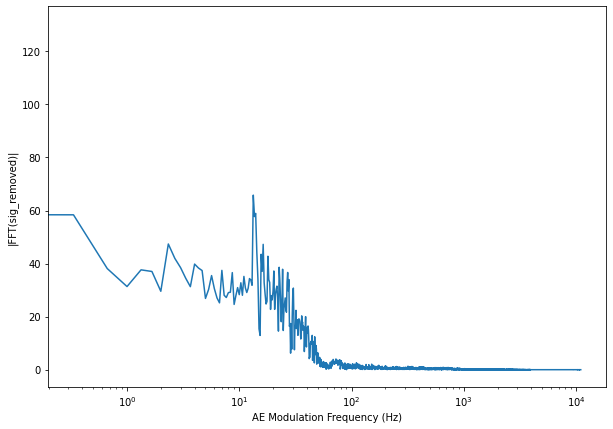

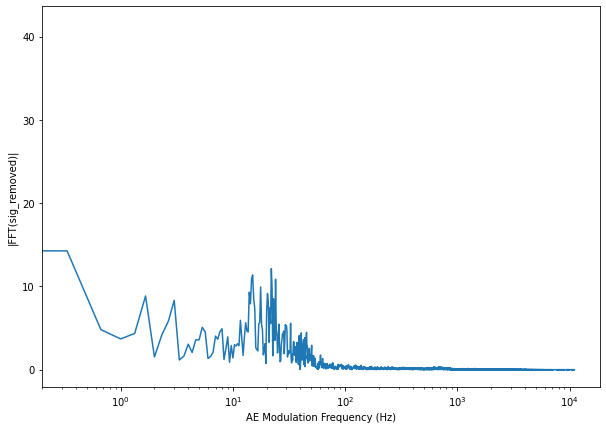

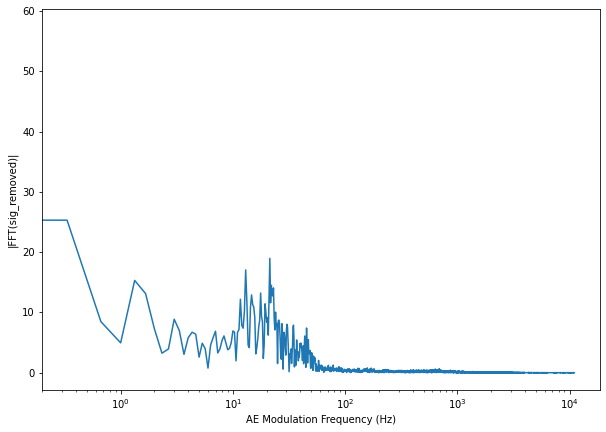

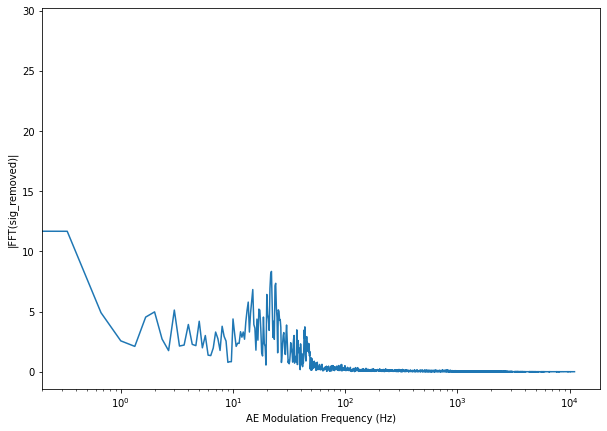

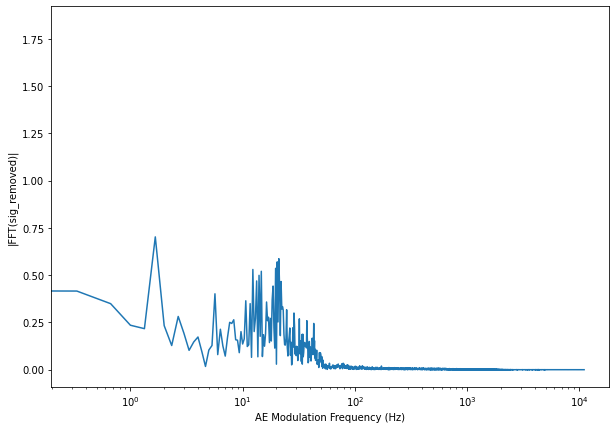

In [64]:
fft_sig_removed = []
for s in sig_removed:
  fft_sig_removed.append(scipy.fft.fft(s))
  fft_abs_sig_removed=np.abs(fft_sig_removed[-1])
  freq = np.linspace(0, sr, len(fft_abs_sig_removed)) 
    
  plt.figure(figsize=(10,7))

#  plt.plot(freq[0:int(len(freq)/2)],1/(signal_duration_P1*sr**2)*fft_abs_sig_removed[0:int(len(freq)/2)]**2)
  plt.plot(freq[0:int(len(freq)/2)],fft_abs_sig_removed[0:int(len(freq)/2)])

  plt.xlabel("AE Modulation Frequency (Hz)")
  plt.ylabel("|FFT(sig_removed)|")
  plt.xscale('log')
  #plt.yscale('log')
  plt.show()


  

##  3.2 Bank-filter the Host signal 

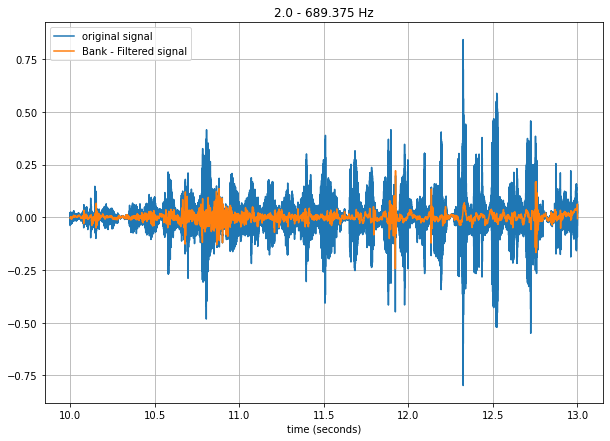

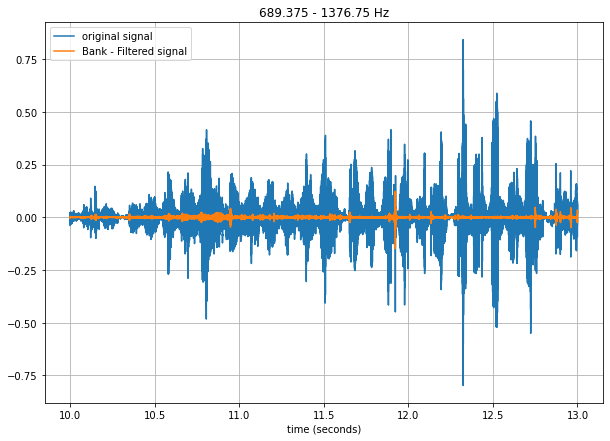

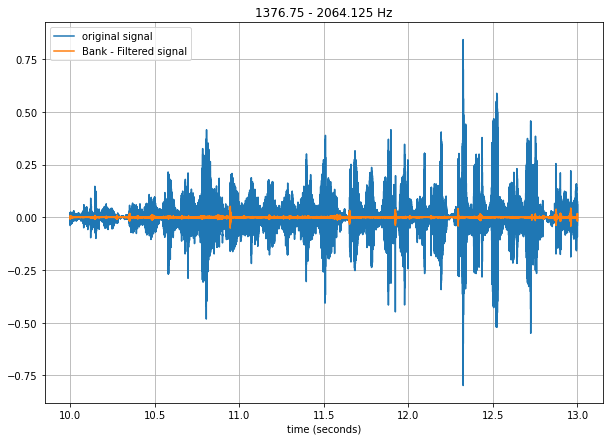

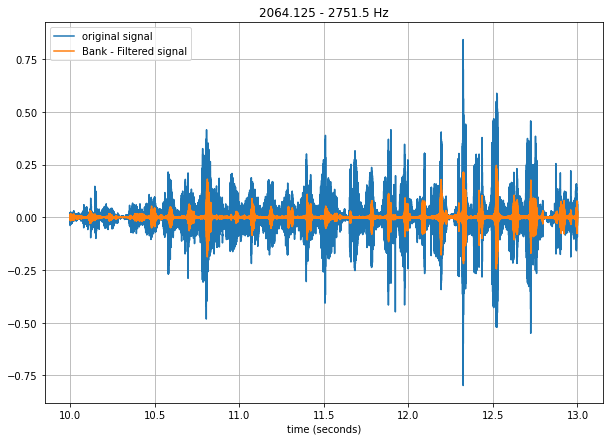

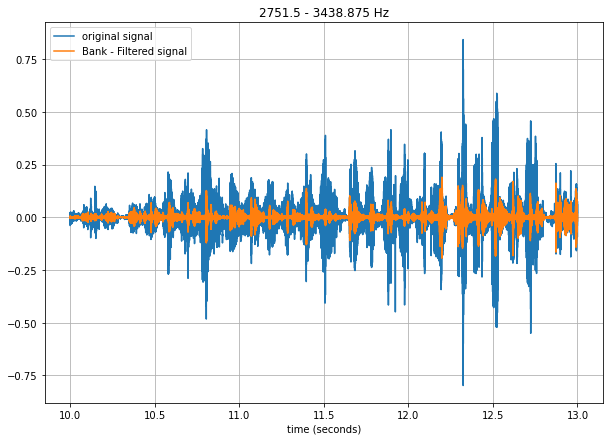

...

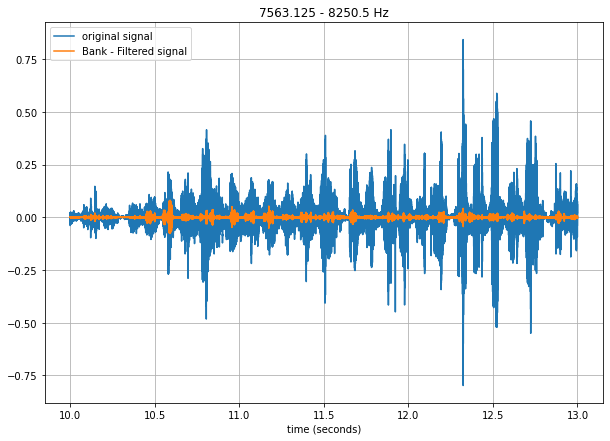

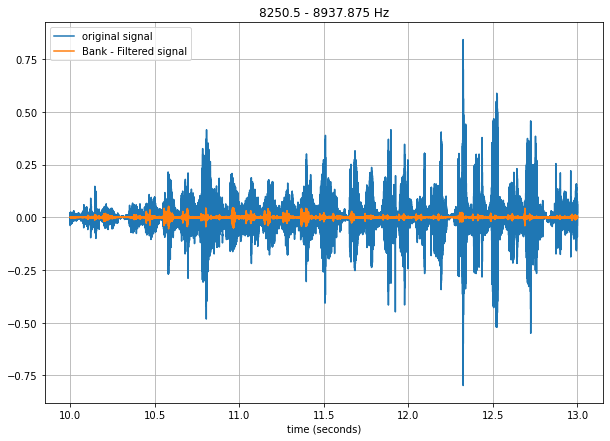

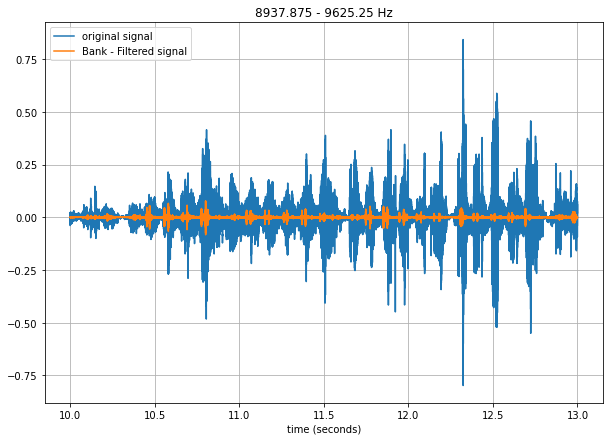

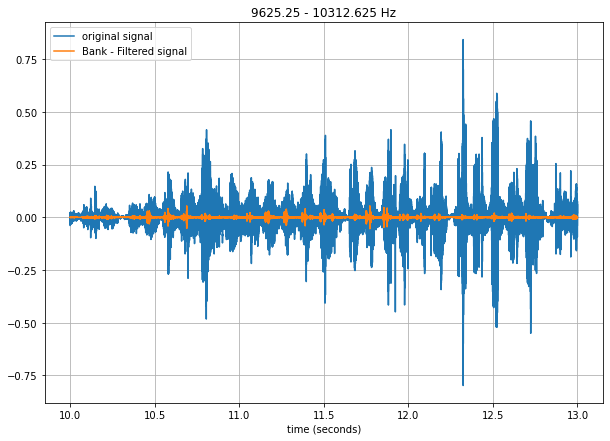

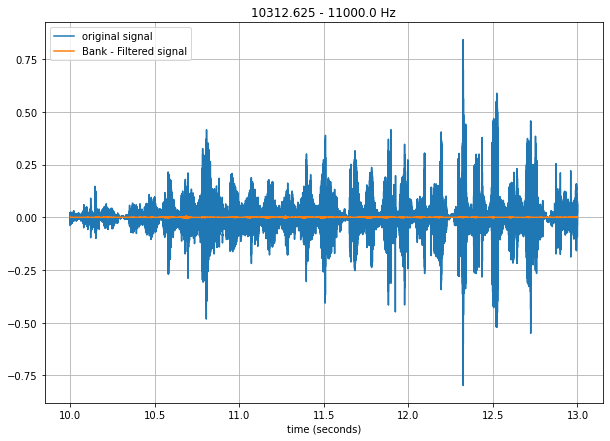

In [65]:
 # timepoints for the plots
t = np.linspace(signal_start_SH1, signal_start_SH1 + signal_duration_SH1, len(signalSH1), endpoint=False)


bp_signalSH1 = []
for i in range(len(freqs)-1):
  lowcut = freqs[i]
  highcut = freqs[i+1]

  #bp_signalSH1.append(butter_bandpass_filter(signalSH1, lowcut, highcut, sr, order=6))
  bp_signalSH1.append(bandpass(signalSH1, sr, lowcut, highcut, bandwidth=10,ripple_db=50))

  plt.figure(figsize=(10,7))
  plt.clf()
  plt.plot(t, signalSH1, label='original signal')
  plt.plot(t, bp_signalSH1[i], label='Bank - Filtered signal' )
  plt.xlabel('time (seconds)')
  plt.grid(True)
  plt.axis('tight')
  #plt.ylim([-1,1])
  plt.legend(loc='upper left')
  plt.title(str(lowcut)+' - '+str(highcut)+' Hz')
  plt.show()

## 3.3 Get AE of bank-filtered Host signal

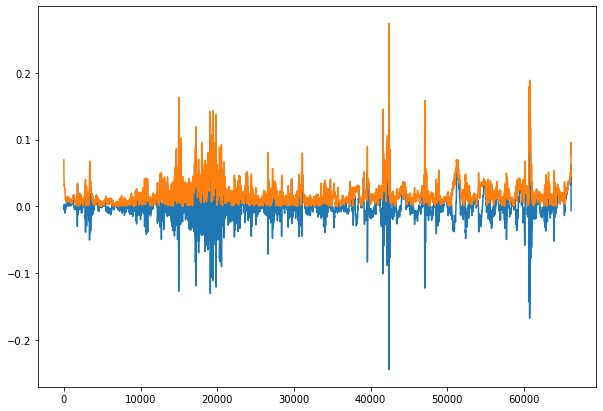

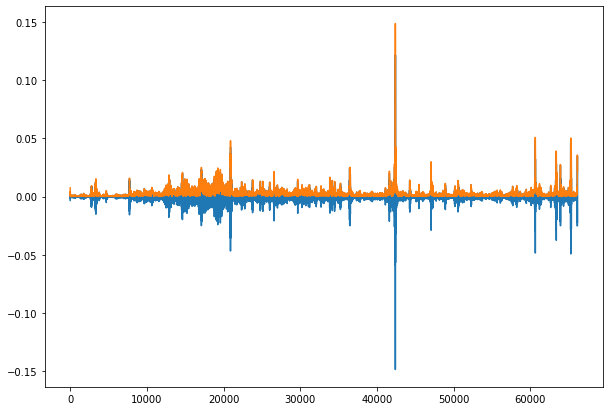

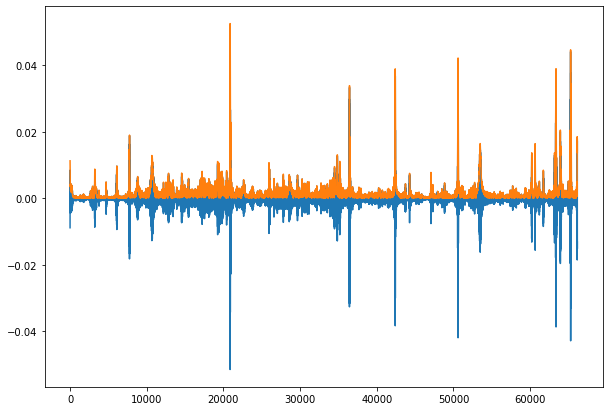

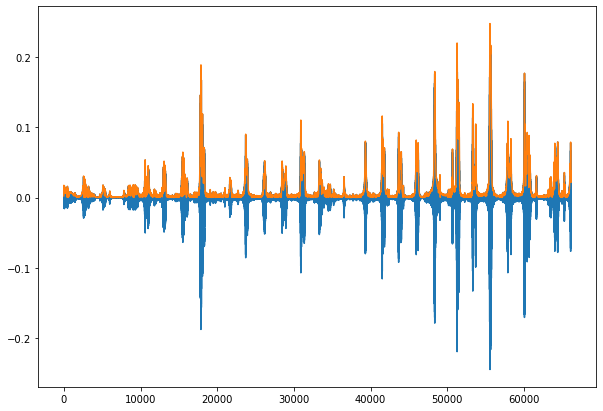

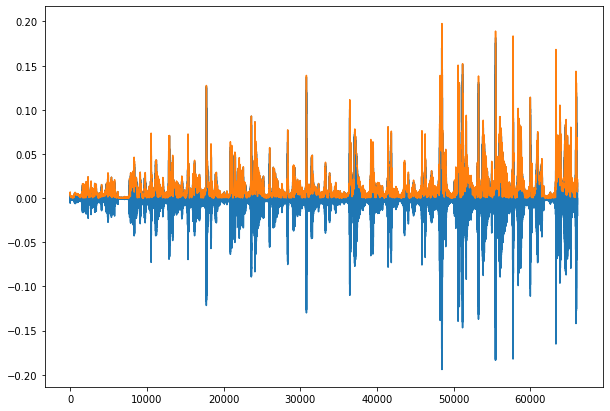

...

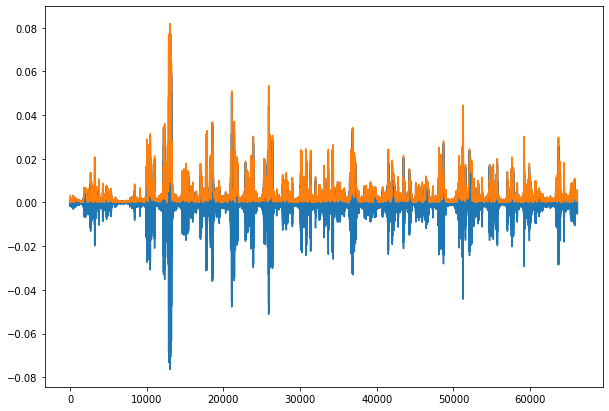

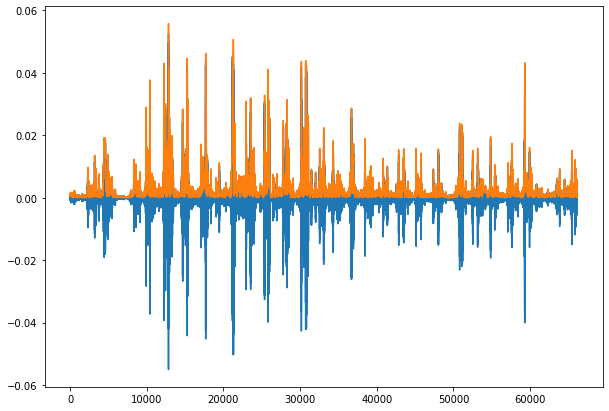

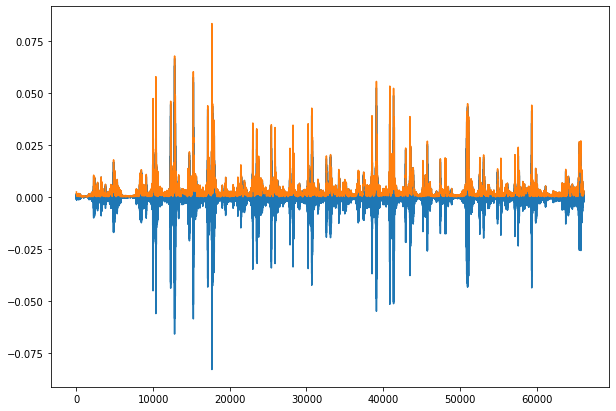

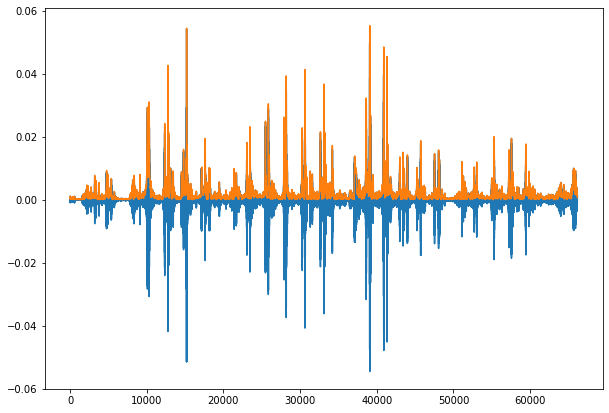

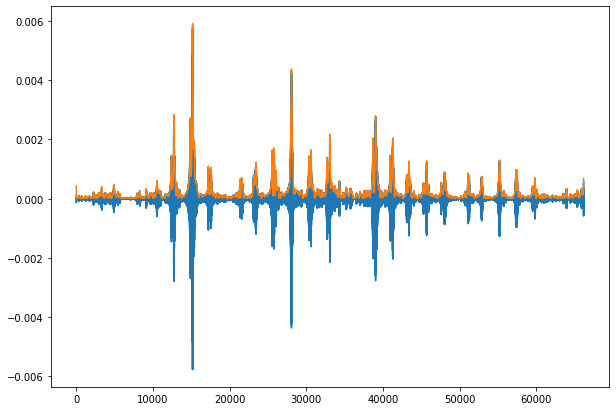

In [66]:
# get A.E. using hilbert transform
amp_env_SH1 = []
inst_phase_o_SH1 = []
for s in bp_signalSH1:
  z = (hilbert(s)) #form the analytical signal
  amp_env_SH1.append(np.abs(z)) #envelope extraction
  inst_phase_o_SH1.append(np.unwrap(np.angle(z)))#inst phase
  inst_freq = np.diff(inst_phase_o_SH1)/(2*np.pi)*sr #inst frequency

  plt.figure(figsize=(10,7))
  plt.plot(s)
  plt.plot(amp_env_SH1[-1])
  #plt.ylim([-0.5,0.5])
  plt.show()

## 3.4 Implant removed frequency band

###3.4.1 In time domain: Add removed (diff) narrowband signals to AE of host narrowband signals

In [67]:

modified_amp_env = []

for i in range(len(amp_env_SH1)):
  modified_amp_env.append(amp_env_SH1[i] + sig_removed[i])

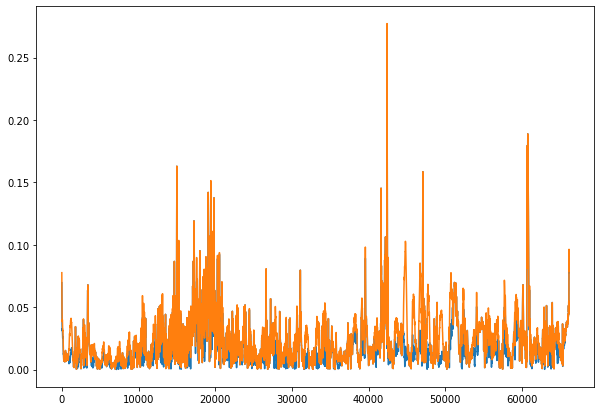

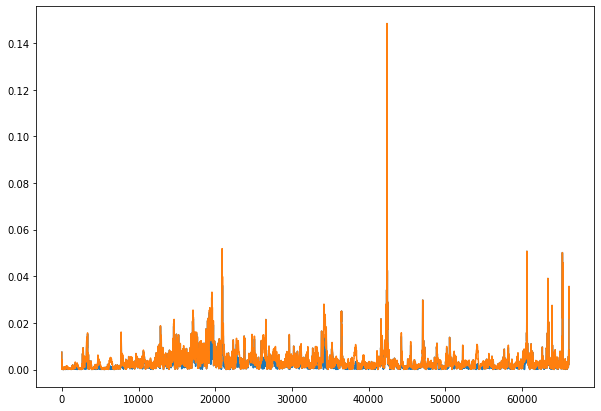

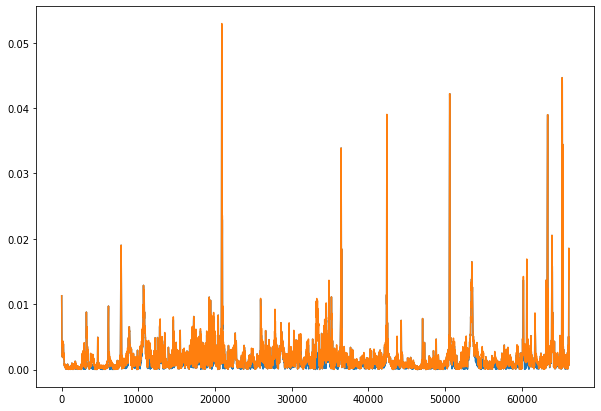

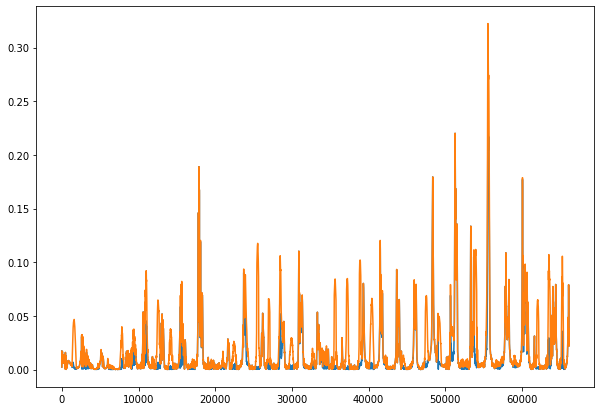

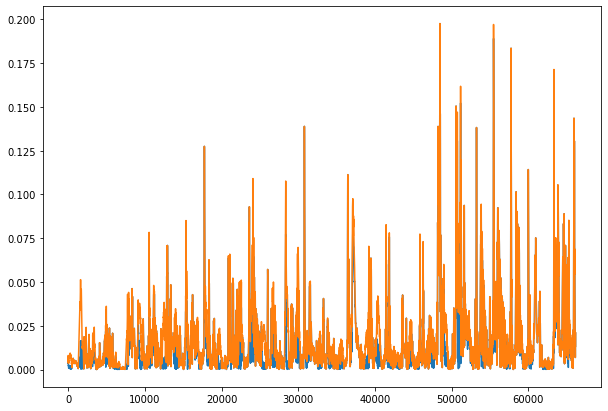

...

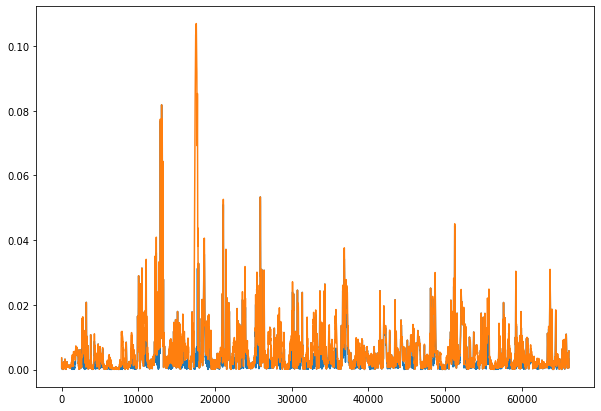

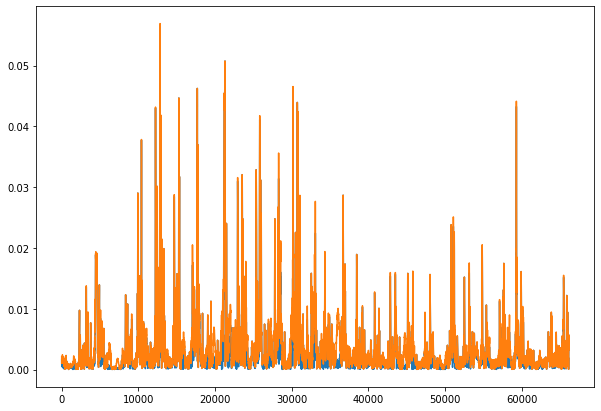

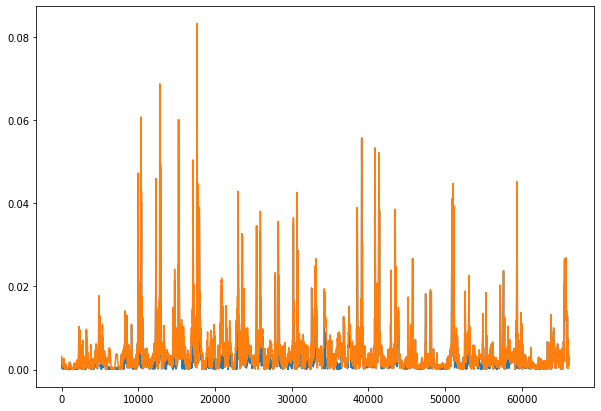

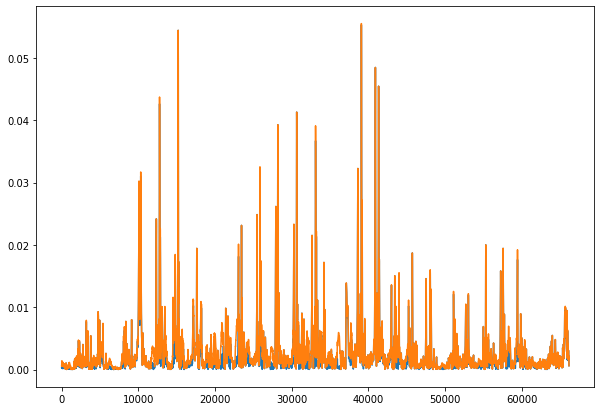

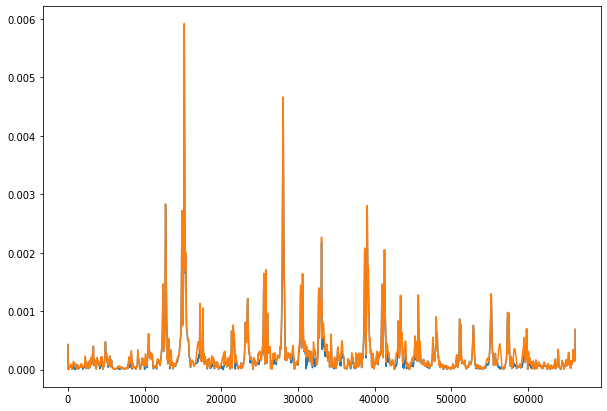

In [68]:
for i in range(len(modified_amp_env)):
  plt.figure(figsize=(10,7))
  plt.plot(amp_env_SH1[i])
  plt.plot(modified_amp_env[i])

  plt.show()

## 3.5 Put together the modified Host signal

In [69]:
envR_SH1 = [i / j for i, j in zip(modified_amp_env , amp_env_SH1)] # calculate the ratio
modified_bp_signal = [ i * j for i,j in zip(bp_signalSH1, envR_SH1)] # multiply original audio with ratio


In [70]:
modified_signal=sum(modified_bp_signal)


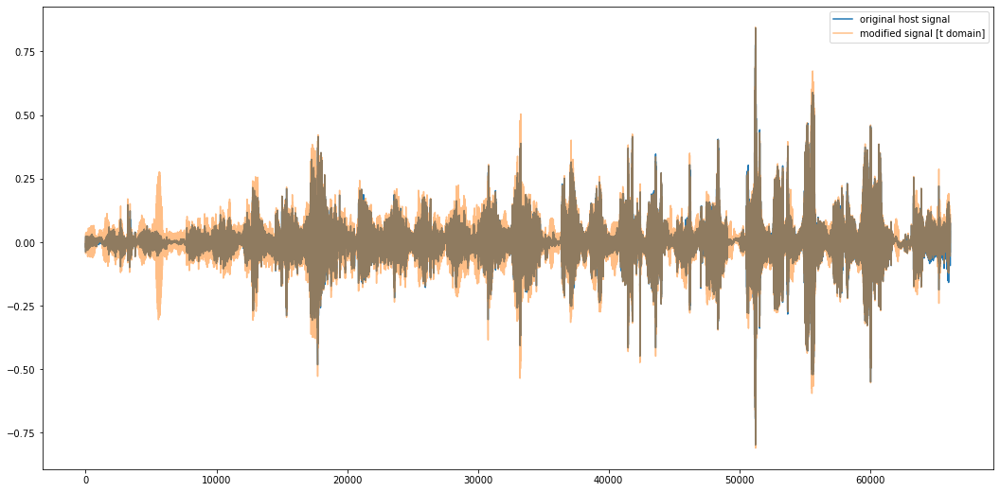

In [71]:
plt.figure(figsize=(18,9))
plt.plot(signalSH1,label='original host signal')
plt.plot(modified_signal,alpha=0.5,label='modified signal [t domain]')
plt.legend()
plt.show()






## 3.6 Check modified signal

### 3.6.1 Compare spectrograms

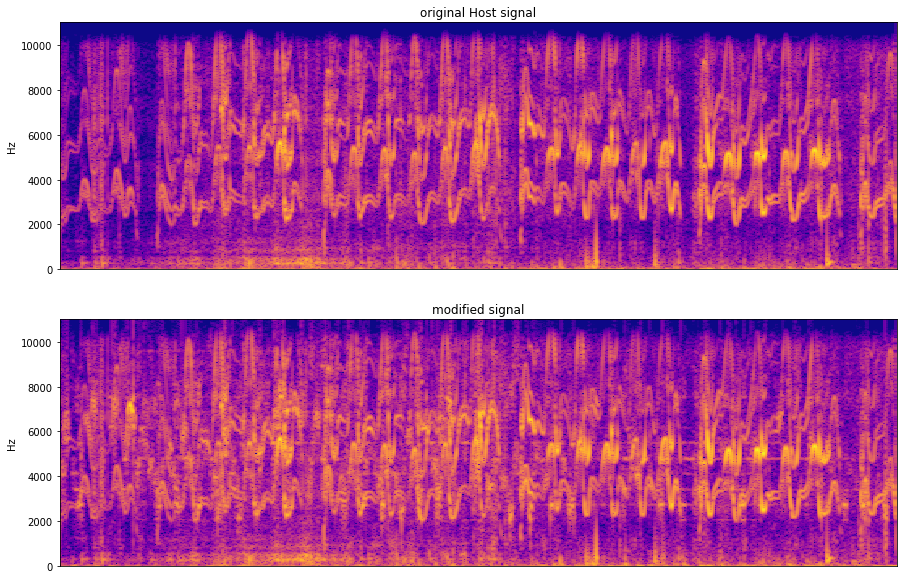

In [72]:
window_size = 1024
window_shift = 16
fig, ax = plt.subplots(nrows=2, sharex=False,gridspec_kw={'height_ratios': [1, 1]},figsize=(15,10))

#Original Host signal

stft = librosa.stft(signalSH1,n_fft=512,hop_length=128)
spec_power = np.abs(stft)**2
p_to_db = librosa.power_to_db(spec_power)

librosa.display.specshow(p_to_db, sr=sr,y_axis='linear',ax = ax[0], cmap='plasma')
ax[0].set_title('original Host signal')

#modified signal

stft = librosa.stft(modified_signal,n_fft=512,hop_length=128)
spec_power = np.abs(stft)**2
p_to_db = librosa.power_to_db(spec_power)

librosa.display.specshow(p_to_db, sr=sr,y_axis='linear',ax = ax[1], cmap='plasma')
ax[1].set_title('modified signal')




plt.show()

### 3.6.2 Compare audio

In [76]:
print('ORIGINAL HOST AUDIO CLIP')

Audio(data=signalSH1,rate=sr)

ORIGINAL HOST AUDIO CLIP


In [77]:
print('MODIFIED HOST AUDIO CLIP')

Audio(data=modified_signal,rate=sr)

MODIFIED HOST AUDIO CLIP


In [78]:
print('SELECTED PART OF PASARISE AUDIO CLIP')

Audio(data=signalP1,rate=sr)

SELECTED PART OF PASARISE AUDIO CLIP


### 3.6.3 Save recovered audio

In [ ]:
# Give a name for the file to be saved
save_name = 'modified_SingleHost1.wav'

# write file (if in colab, remember to download it before leaving the session)
sf.write(save_name, modified_signal, sr)

# General sandbox area

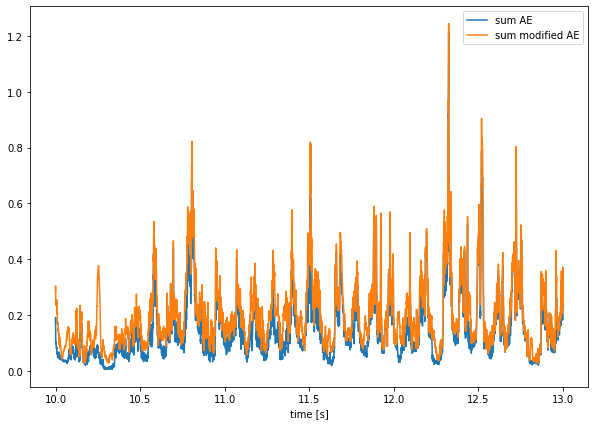

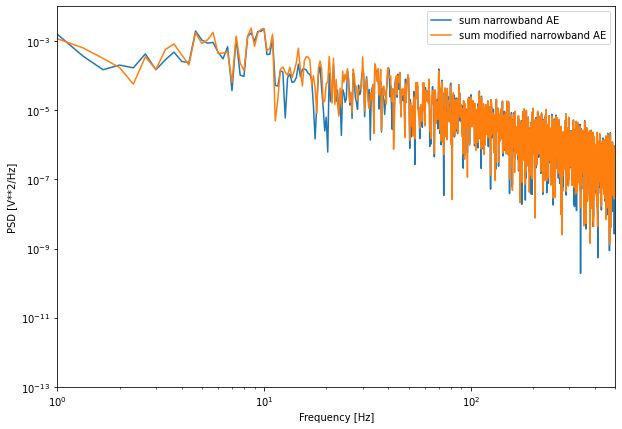

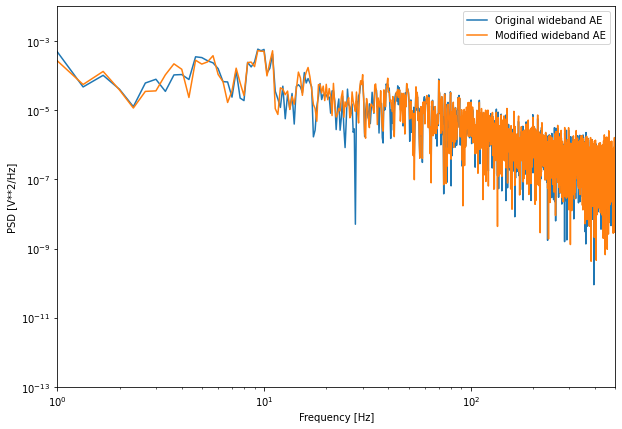

In [ ]:
sum_env = sum(amp_env_SH1)
sum_mod_env = sum(modified_amp_env)


plt.figure(figsize=(10,7))
plt.plot(t,np.abs(sum_env),label='sum AE')
plt.plot(t,np.abs(sum_mod_env),label='sum modified AE')

plt.xlabel('time [s]')
plt.legend()
plt.show()


f_psd_sum_amp_env,psd_sum_amp_env = sig.periodogram(sum_env,sr)
f_psd_sum_mod_amp_env,psd_sum_mod_amp_env = sig.periodogram(sum_mod_env,sr)

full_amp_env = hilbert(signalSH1)
f_psd_amp_env,psd_amp_env = sig.periodogram(np.abs(full_amp_env),sr)

full_mod_amp_env = hilbert(modified_signal)
f_psd_mod_amp_env,psd_mod_amp_env = sig.periodogram(np.abs(full_mod_amp_env),sr)


plt.figure(figsize=(10,7))
plt.plot(f_psd_sum_amp_env, psd_sum_amp_env, label='sum narrowband AE')
plt.plot(f_psd_sum_mod_amp_env, psd_sum_mod_amp_env,label='sum modified narrowband AE')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.xlim([1,500])
plt.ylim([1e-13,1e-2])
plt.legend()
plt.show()






plt.figure(figsize=(10,7))
plt.plot(f_psd_amp_env,psd_amp_env,label='Original wideband AE')
plt.plot(f_psd_mod_amp_env,psd_mod_amp_env,label='Modified wideband AE')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.xlim([1,500])
plt.ylim([1e-13,1e-2])
plt.legend()
plt.show()

### check if frequencies are added

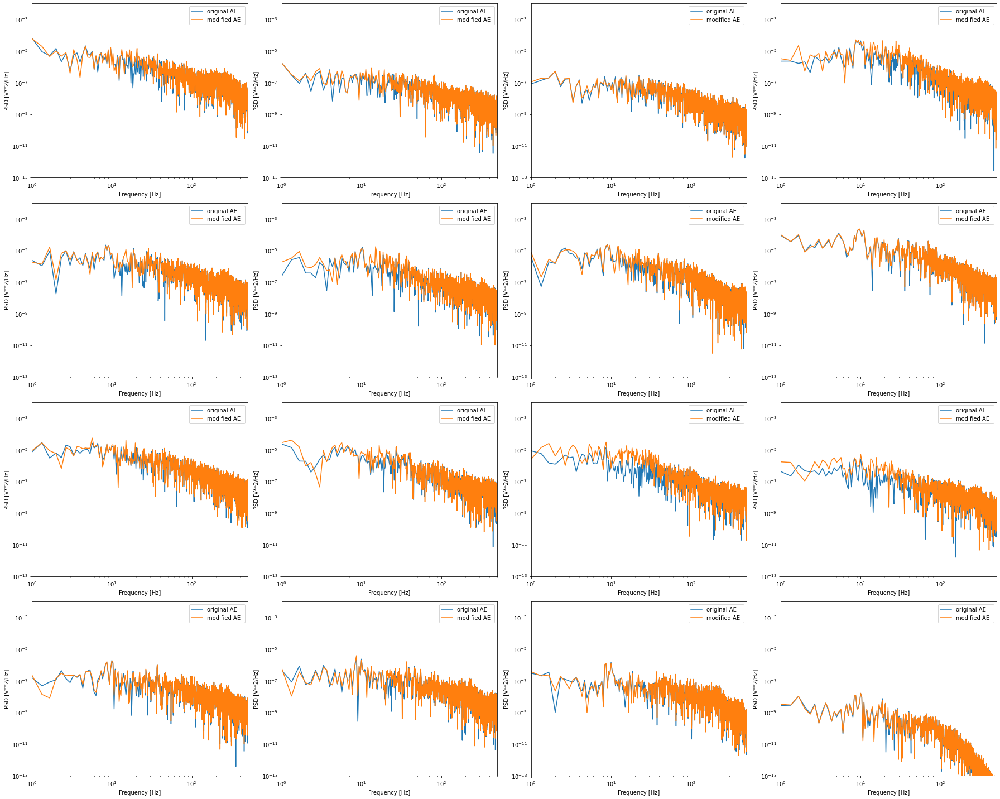

In [ ]:

rows = 4
cols = 4
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(25, 20))
f_i=0

for i in range(len(amp_env_SH1)):
  r = i // cols
  c = i % cols
  ax = axes[r][c]
  lowcut = freqs[f_i]
  highcut = freqs[f_i+1]


  fft_mod_env = scipy.fft.fft(modified_amp_env[i])
  fft_env = scipy.fft.fft(amp_env_SH1[i])

  freq = np.linspace(0, sr, len(fft_mod_env)) 
  ax.plot(freq[0:int(len(freq)/2)],1/(signal_duration_SH1*sr**2)*np.abs(fft_env[0:int(len(freq)/2)])**2,label='original AE ')
  ax.plot(freq[0:int(len(freq)/2)],1/(signal_duration_SH1*sr**2)*np.abs(fft_mod_env[0:int(len(freq)/2)])**2,label='modified AE ')

  ax.set_xscale('log')
  ax.set_yscale('log')
  ax.set_xlim([1,500])
  ax.set_xlabel('Frequency [Hz]')
  ax.set_ylabel('PSD [V**2/Hz]')
  ax.set_ylim([1e-13,1e-2])
  ax.legend()
  f_i+=1

fig.tight_layout()  
plt.show()
